## Matrix Processing with Pandas
### 2023-10-12

This notebook details the step to process the matrix of allele frequencies for each variant in each sample. The matrix is generated from the output `bcftools` pipeline.

### Loading data into Pandas

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
# set the display format for floating-point numbers
pd.options.display.float_format = '{:.4f}'.format
pd.set_option('display.max_columns', 999)

In [3]:
# load an example filtered matrix of footprinting scores, which overlap the variant sites in the vcf files

df_fpscore = pd.read_csv("/home/msazizan/hyperspace/gatk-workflow/plotting/raw_inputs/fps/TFDP1_M08108_2.00_BRCA-subtype-vcf-filtered-matrix.txt", sep="\t")

# drop the column "TFBS_strand" and "TFBS_score"
df_fpscore = df_fpscore.drop(columns=["TFBS_strand", "TFBS_score"])
# rename columns in the dataframe
df_fpscore = df_fpscore.rename(columns={"TFBS_chr": "Chromosome", "TFBS_start": "Start", "TFBS_end": "End", "2GAMBDQ_Normal-like_score": "2GAMBDQ_Norm_fps"})
# for all column names that end with the string 'score', replace the string with 'fps'
df_fpscore = df_fpscore.rename(columns=lambda x: x.replace('score', 'fps') if x.endswith('score') else x)
df_fpscore.head(n=10)

,Chromosome,Start,End,98JKPD8_LumA_fps,ANAB5F7_Basal_fps,S6R691V_Her2_fps,PU24GB8_LumB_fps,2GAMBDQ_Norm_fps
0,chr1,191257,191268,0.0000,0.0000,0.0000,0.0000,0.0000
1,chr1,818021,818032,0.0297,0.0440,0.0213,0.0347,0.0344
2,chr1,818780,818791,0.0257,0.0238,0.0227,0.0281,0.0339
3,chr1,960570,960581,0.2805,0.3350,0.2849,0.2762,0.2299
4,chr1,977015,977026,1.1005,0.5051,0.7104,1.2130,1.3015
5,chr1,977047,977058,0.8818,0.4097,0.5317,0.9863,1.0710
6,chr1,977110,977121,0.1314,0.0885,0.1054,0.1681,0.1549
7,chr1,977142,977153,0.1444,0.0823,0.0923,0.1781,0.1429
8,chr1,977174,977185,0.2262,0.1063,0.1381,0.2432,0.2231
9,chr1,977206,977217,0.2971,0.1549,0.2170,0.3343,0.3109


In [4]:
# create a vcf load function for the query vcfs
def load_vcf(vcf_path):
    # load up the vcf file with indels and multiallelic sites split into separate rows
    df_vcf = pd.read_csv(vcf_path, sep="\t")
    # rename columns in the dataframe
    df_vcf = df_vcf.rename(columns={"#[1]CHROM": "Chromosome", "[2]POS": "Start", "[3]REF": "ref_allele", "[4]ALT": "alt_allele", "[5]AF": "AF"})
    # add a column next to the "start" column called "end" with the same value as the "start" column
    df_vcf.insert(2, "End", df_vcf["Start"])
    return df_vcf

# now put the paths in a list
paths = [
    "/home/msazizan/hyperspace/gatk-workflow/plotting/raw_inputs/af/ANAB5F7/ANAB5F7_TFDP1_M08108_2.00_AF-per-site-with-indels.txt",
    "/home/msazizan/hyperspace/gatk-workflow/plotting/raw_inputs/af/98JKPD8/98JKPD8_TFDP1_M08108_2.00_AF-per-site-with-indels.txt",
    "/home/msazizan/hyperspace/gatk-workflow/plotting/raw_inputs/af/PU24GB8/PU24GB8_TFDP1_M08108_2.00_AF-per-site-with-indels.txt",
    "/home/msazizan/hyperspace/gatk-workflow/plotting/raw_inputs/af/S6R691V/S6R691V_TFDP1_M08108_2.00_AF-per-site-with-indels.txt",
    "/home/msazizan/hyperspace/gatk-workflow/plotting/raw_inputs/af/2GAMBDQ/2GAMBDQ_TFDP1_M08108_2.00_AF-per-site-with-indels.txt"
]

# create a list of IDs
ids = [ "ANAB5F7_basal", "98JKPD8_lumA", "PU24GB8_lumB", "S6R691V_her2", "2GAMBDQ_norm"]

# create a pair dictionary
path_id_dict = {id: load_vcf(path) for id in ids for path in paths if id.split("_")[0] in path}

print(path_id_dict)


{'ANAB5F7_basal':      Chromosome      Start        End ref_allele   alt_allele     AF
0          chr1     818025     818025          C            A 0.8125
1          chr1     818783     818783          T            C 0.0333
2          chr1     977023     977023          G            A 0.9412
3          chr1     977055     977055          G            A 0.5000
4          chr1     977118     977118          G            A 0.8529
...         ...        ...        ...        ...          ...    ...
5979       chrX  153494830  153494830          G            A 0.3529
5980       chrX  153495413  153495413          G            A 0.8824
5981       chrX  154444635  154444635    GGGACGG  GGGACGGACGG 0.0588
5982       chrY   11108021   11108021          C            T 0.3824
5983       chrY   11108024   11108024          C            T 0.2941

[5984 rows x 6 columns], '98JKPD8_lumA':      Chromosome      Start        End ref_allele   alt_allele     AF
0          chr1     818025     818025      

### Converting Dataframes into Pyranges Objects with PyRanges

In [5]:
import pyranges as pr

gr_fpscore = pr.PyRanges(df_fpscore)
print(type(gr_fpscore))
gr_fpscore

<class 'pyranges.pyranges_main.PyRanges'>


/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}


,Chromosome,Start,End,98JKPD8_LumA_fps,ANAB5F7_Basal_fps,S6R691V_Her2_fps,PU24GB8_LumB_fps,2GAMBDQ_Norm_fps
0,chr1,191257,191268,0.0000,0.0000,0.0000,0.0000,0.0000
1,chr1,818021,818032,0.0297,0.0440,0.0213,0.0347,0.0344
2,chr1,818780,818791,0.0257,0.0238,0.0227,0.0281,0.0339
3,chr1,960570,960581,0.2805,0.3350,0.2849,0.2762,0.2299
4,chr1,977015,977026,1.1005,0.5051,0.7104,1.2130,1.3015
...,...,...,...,...,...,...,...,...
9555,chrX,153934861,153934872,0.1967,0.1679,0.1721,0.1905,0.1616
9556,chrX,154444629,154444640,0.0490,0.0743,0.0731,0.0901,0.0423
9557,chrX,155010397,155010408,0.0118,0.0050,0.0088,0.0130,0.0199
9558,chrX,155641610,155641621,0.0125,0.0124,0.0133,0.0149,0.0174


In [17]:
# delete a variable from current namespace
# %reset_selective -f pathstring

In [6]:
# load up vcf dfs into pyranges 
grs = {}
for name,vcf in path_id_dict.items():
    gr_vcf = pr.PyRanges(vcf)
    grs[name] = gr_vcf

print(grs)

{'ANAB5F7_basal': +--------------+-----------+-----------+--------------+-------+
| Chromosome   | Start     | End       | ref_allele   | +2    |
| (category)   | (int64)   | (int64)   | (object)     | ...   |
|--------------+-----------+-----------+--------------+-------|
| chr1         | 818025    | 818025    | C            | ...   |
| chr1         | 818783    | 818783    | T            | ...   |
| chr1         | 977023    | 977023    | G            | ...   |
| chr1         | 977055    | 977055    | G            | ...   |
| ...          | ...       | ...       | ...          | ...   |
| chrX         | 154444635 | 154444635 | GGGACGG      | ...   |
| chrX         | 153495413 | 153495413 | G            | ...   |
| chrX         | 153494830 | 153494830 | G            | ...   |
| chrX         | 150364545 | 150364545 | C            | ...   |
| chrY         | 11108024  | 11108024  | C            | ...   |
| chrY         | 11108021  | 11108021  | C            | ...   |
+--------------+------

/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}
/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}
/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain c

### Exploratory Plots with Seaborn

In [ ]:
count = 0
for key, val in grs.items():
    
    if count == 0:
        overlap = gr_fpscore.join(val, how='left', suffix=f"_{key}_varsite_pos", preserve_order = True)
    else:
        overlap = overlap.join(val, how='left', suffix=f"_{key}_varsite_pos", preserve_order = True)
    
    # drop the column "End" column
    overlap = overlap.drop([f"End_{key}_varsite_pos"])

    # cast back into a dataframe and rename metadata columns
    df = overlap.df.rename(columns={f"Start_{key}_varsite_pos": f"{key}_varsite_pos", "ref_allele": f"{key}_ref_allele", "alt_allele": f"{key}_alt_allele", "AF": f"{key}_AF"})
    
    # replace all the -1 values in column 'Start_varsites', 'ref_allele' and 'alt_allele', and AF with 0
    # Define a dictionary mapping column names to values to replace
    replace_dict = {f"{key}_varsite_pos": {-1: None}, f"{key}_ref_allele": {str(-1): None}, f"{key}_alt_allele": {str(-1): None}, f"{key}_AF": {-1: 0}}
    df = df.replace(replace_dict)

    # cast back into pyrange object
    overlap = pr.PyRanges(df)

    # increment count
    count += 1

# save to file
# overlap.df.to_csv("TFDP1_M08108_2.00_fpscore-af-varsites-combined-matrix.tsv", sep="\t", index=False, na_rep='NULL')

overlap.df[19:30]

The chr regions are somehow not unique anymore because each region can be associated with multiple alleles and these are written onto new lines. To reduce the chr regions to unique sites and collapse the rows into unique regions, what we can do is to assign only the allelic site that has the largest AF value out of the rest mapped to the same region (using `max()` method).

First, write a test script to see if the logic works. 

In [ ]:
test_overlap = gr_fpscore.join(grs['ANAB5F7_basal'], how='left', suffix="_ANAB5F7_basal_varsite_pos", preserve_order = True)

# drop END column
test_overlap = test_overlap.drop(["End_ANAB5F7_basal_varsite_pos"])
# cluster the pyRanges object by genomic range
test_overlap = test_overlap.cluster(slack=-1)
# filter the pandas df representation of the pyRanges object by the AF column max value for each cluster/group
filtered_df = test_overlap.df.loc[test_overlap.df.groupby('Cluster')['AF'].idxmax()]
# then rename the columns 
filtered_df = filtered_df.rename(columns={"Start_ANAB5F7_basal_varsite_pos": "ANAB5F7_basal_varsite_pos", "ref_allele": "ANAB5F7_basal_ref_allele", "alt_allele": "ANAB5F7_basal_alt_allele", "AF": "ANAB5F7_basal_AF"})
# replace all the -1 values in column 'Start_varsites', 'ref_allele' and 'alt_allele', and AF with 0
# Define a dictionary mapping column names to values to replace
replace_dict = {"ANAB5F7_basal_varsite_pos": {-1: None}, "ANAB5F7_basal_ref_allele": {str(-1): None}, "ANAB5F7_basal_alt_allele": {str(-1): None}, "ANAB5F7_basal_AF": {-1: 0}}
filtered_df = filtered_df.replace(replace_dict)
# drop cluster column
filtered_df = filtered_df.drop(columns=["Cluster"])

filtered_gr = pr.PyRanges(filtered_df)

test_overlap = filtered_gr.join(grs['2GAMBDQ_norm'], how='left', suffix="_2GAMBDQ_norm_varsite_pos", preserve_order = True)
# drop END column
test_overlap = test_overlap.drop(["End_2GAMBDQ_norm_varsite_pos"])
# cluster the pyRanges object by genomic range
test_overlap = test_overlap.cluster(slack=-1)
# filter the pandas df representation of the pyRanges object by the AF column max value for each cluster/group
filtered_df = test_overlap.df.loc[test_overlap.df.groupby('Cluster')['AF'].idxmax()]
# then rename the columns 
filtered_df = filtered_df.rename(columns={"Start_2GAMBDQ_norm_varsite_pos": "2GAMBDQ_norm_varsite_pos", "ref_allele": "2GAMBDQ_norm_ref_allele", "alt_allele": "2GAMBDQ_norm_alt_allele", "AF": "2GAMBDQ_norm_AF"})
# replace all the -1 values in column 'Start_varsites', 'ref_allele' and 'alt_allele', and AF with 0
# Define a dictionary mapping column names to values to replace
replace_dict = {"2GAMBDQ_norm_varsite_pos": {-1: None}, "2GAMBDQ_norm_ref_allele": {str(-1): None}, "2GAMBDQ_norm_alt_allele": {str(-1): None}, "2GAMBDQ_norm_AF": {-1: 0}}
filtered_df = filtered_df.replace(replace_dict)
# drop cluster column
filtered_df = filtered_df.drop(columns=["Cluster"])
filtered_df.iloc[19:30]
# filtered_df.shape

# # merge back the af_max series with the original dataframe
# result_df = test_overlap.df.merge(af_max, left_on='Cluster', right_index=True, suffixes=('', '_max'))
# result_df.head(n=30)

Then, incorporate a `for` loop to process and merge all of the subtype data. 

In [7]:
count = 0
for key, val in grs.items():  
    if count == 0:
        overlap = gr_fpscore.join(val, how='left', suffix=f"_{key}_varsite_pos", preserve_order = True)
    else:
        overlap = filtered_gr.join(val, how='left', suffix=f"_{key}_varsite_pos", preserve_order = True)
    
    # drop the column "End" column
    overlap = overlap.drop([f"End_{key}_varsite_pos"])

    # cluster the pyRanges object by genomic range
    overlap = overlap.cluster(slack=-1)

    # cast back into a dataframe and filter by the AF column's max value (per cluster); this returns a filtered dataframe
    filtered_df = overlap.df.loc[overlap.df.groupby('Cluster')['AF'].idxmax()]

    # then rename the columns
    filtered_df = filtered_df.rename(columns={f"Start_{key}_varsite_pos": f"{key}_varsite_pos", "ref_allele": f"{key}_ref_allele", "alt_allele": f"{key}_alt_allele", "AF": f"{key}_AF"})
    
    # replace all the -1 values in column 'Start_varsites', 'ref_allele' and 'alt_allele', and AF with 0
    # Define a dictionary mapping column names to values to replace
    replace_dict = {f"{key}_varsite_pos": {-1: None}, f"{key}_ref_allele": {str(-1): None}, f"{key}_alt_allele": {str(-1): None}, f"{key}_AF": {-1: 0}}
    filtered_df = filtered_df.replace(replace_dict)

    # drop cluster column
    filtered_df = filtered_df.drop(columns=["Cluster"])

    # cast back into pyrange object
    filtered_gr = pr.PyRanges(filtered_df)

    # increment count
    count += 1

final_df = filtered_gr.df

# create a column called 'region_id'
final_df["region_id"] = final_df["Chromosome"].astype(str) + ":" + final_df["Start"].astype(str) + "-" + final_df["End"].astype(str)

# for all column name ending with the string '_fps', split the string, take the second element, change the first letter in the string to lowercase, and reconstruct the original string with the new first letter
final_df = final_df.rename(columns=lambda x: x.split('_')[0] + '_' + x.split('_')[1][0].lower() + x.split('_')[1][1:] + '_fps' if x.endswith('_fps') else x)

# save to file
final_df.to_csv("TFDP1_M08108_2.00_fpscore-af-varsites-combined-matrix-wide.tsv", sep="\t", index=False, na_rep='NULL')

# filtered_gr.df.shape
final_df.iloc[19:30]

/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}
/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}
/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain c

,Chromosome,Start,End,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,ANAB5F7_basal_varsite_pos,ANAB5F7_basal_ref_allele,ANAB5F7_basal_alt_allele,ANAB5F7_basal_AF,98JKPD8_lumA_varsite_pos,98JKPD8_lumA_ref_allele,98JKPD8_lumA_alt_allele,98JKPD8_lumA_AF,PU24GB8_lumB_varsite_pos,PU24GB8_lumB_ref_allele,PU24GB8_lumB_alt_allele,PU24GB8_lumB_AF,S6R691V_her2_varsite_pos,S6R691V_her2_ref_allele,S6R691V_her2_alt_allele,S6R691V_her2_AF,2GAMBDQ_norm_varsite_pos,2GAMBDQ_norm_ref_allele,2GAMBDQ_norm_alt_allele,2GAMBDQ_norm_AF,region_id
19,chr1,977682,977693,0.1363,0.0678,0.0709,0.0913,0.1019,None,None,None,0.0000,None,None,None,0.0000,977690,G,A,0.7222,None,None,None,0.0000,None,None,None,0.0000,chr1:977682-977693
20,chr1,986626,986637,0.0621,0.0196,0.0283,0.0515,0.0481,986629,G,A,0.1562,986629,G,A,0.1667,986629,G,A,0.1765,986629,G,A,0.2647,986629,G,A,0.1429,chr1:986626-986637
21,chr1,996339,996350,0.0807,0.0482,0.0648,0.0546,0.0691,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,chr1:996339-996350
22,chr1,998799,998810,0.1822,0.1835,0.1691,0.1971,0.1331,None,None,None,0.0000,998800,C,G,0.0417,998800,C,G,0.0263,None,None,None,0.0000,None,None,None,0.0000,chr1:998799-998810
23,chr1,999627,999638,0.2275,0.1114,0.1453,0.1925,0.1383,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,999637,G,A,0.0625,chr1:999627-999638
24,chr1,1001633,1001644,0.1499,0.0915,0.0824,0.1110,0.1028,1001634,A,T,0.0294,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,chr1:1001633-1001644
25,chr1,1019832,1019843,0.5272,0.3980,0.3752,0.5294,0.4356,1019833,T,C,1.0000,1019833,T,C,1.0000,1019833,T,C,1.0000,1019833,T,C,1.0000,1019833,T,C,1.0000,chr1:1019832-1019843
26,chr1,1020018,1020029,0.6091,0.5277,0.5095,0.6416,0.4920,None,None,None,0.0000,1020021,G,T,0.0417,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,chr1:1020018-1020029
27,chr1,1020936,1020947,0.3051,0.2161,0.2088,0.2660,0.2361,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,chr1:1020936-1020947
28,chr1,1041174,1041185,0.0610,0.0575,0.0575,0.0821,0.0479,1041178,C,G,0.0312,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,chr1:1041174-1041185


In [8]:
final_df.shape

(9560, 29)

### Exploratory Visualization
#### Plotting Allele Frequency (AF) Distribution

First, let's subset the filtered gr object into a dataframe containing only the AF data. 

Then, we can plot the AF distribution for each subtype.

In [9]:
import seaborn as sns
import numpy as np

In [10]:
# subset the dataframe to get just the _AF columns
af_region_df = final_df.filter(regex='_AF$|_id$')
af_region_df

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF,region_id
0,0.0000,0.0000,0.0263,0.0000,0.0000,chr1:191257-191268
1,0.8125,0.9000,0.8333,0.9000,0.8750,chr1:818021-818032
2,0.0333,0.1250,0.0556,0.0625,0.0000,chr1:818780-818791
3,0.0000,0.0417,0.0000,0.0000,0.0000,chr1:960570-960581
4,0.9412,1.0000,0.9474,0.9118,1.0000,chr1:977015-977026
...,...,...,...,...,...,...
9555,0.0000,0.0000,0.0000,0.0000,0.0625,chrX:153934861-153934872
9556,0.0588,0.1250,0.1053,0.0000,0.0000,chrX:154444629-154444640
9557,0.0000,0.3125,0.3929,0.1000,0.0833,chrX:155010397-155010408
9558,0.0000,0.0000,0.0294,0.0000,0.0000,chrX:155641610-155641621


In [11]:
# reorder columns so that region_id is the first column
cols = af_region_df.columns.tolist()
cols = [cols[-1]] + cols[:-1]
print(cols)

['region_id', 'ANAB5F7_basal_AF', '98JKPD8_lumA_AF', 'PU24GB8_lumB_AF', 'S6R691V_her2_AF', '2GAMBDQ_norm_AF']


In [12]:
af_region_df = af_region_df[cols]
af_region_df

,region_id,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
0,chr1:191257-191268,0.0000,0.0000,0.0263,0.0000,0.0000
1,chr1:818021-818032,0.8125,0.9000,0.8333,0.9000,0.8750
2,chr1:818780-818791,0.0333,0.1250,0.0556,0.0625,0.0000
3,chr1:960570-960581,0.0000,0.0417,0.0000,0.0000,0.0000
4,chr1:977015-977026,0.9412,1.0000,0.9474,0.9118,1.0000
...,...,...,...,...,...,...
9555,chrX:153934861-153934872,0.0000,0.0000,0.0000,0.0000,0.0625
9556,chrX:154444629-154444640,0.0588,0.1250,0.1053,0.0000,0.0000
9557,chrX:155010397-155010408,0.0000,0.3125,0.3929,0.1000,0.0833
9558,chrX:155641610-155641621,0.0000,0.0000,0.0294,0.0000,0.0000


In [13]:
# see summary statistics
af_region_df.describe()

# the observations are very skewed, most values are zeroes

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
count,9560.0000,9560.0000,9560.0000,9560.0000,9560.0000
mean,0.1244,0.1242,0.1239,0.1260,0.1257
std,0.2257,0.2341,0.2284,0.2290,0.2388
min,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.0000,0.0000,0.0000,0.0000,0.0000
50%,0.0294,0.0000,0.0263,0.0294,0.0000
75%,0.1333,0.1250,0.1316,0.1429,0.1250
max,1.0000,1.0000,1.0000,1.0000,1.0000


In [14]:
# this is actually in a wide format, so we need to melt it into a long format for plotting
af_regdf_long = af_region_df.melt(id_vars=["region_id"], var_name="sample_id", value_name="AF")
# remove the "_AF" suffix from the "sample_id" column
af_regdf_long["sample_id"] = af_regdf_long["sample_id"].apply(lambda x: x.replace("_AF", ""))
af_regdf_long

,region_id,sample_id,AF
0,chr1:191257-191268,ANAB5F7_basal,0.0000
1,chr1:818021-818032,ANAB5F7_basal,0.8125
2,chr1:818780-818791,ANAB5F7_basal,0.0333
3,chr1:960570-960581,ANAB5F7_basal,0.0000
4,chr1:977015-977026,ANAB5F7_basal,0.9412
...,...,...,...
47795,chrX:153934861-153934872,2GAMBDQ_norm,0.0625
47796,chrX:154444629-154444640,2GAMBDQ_norm,0.0000
47797,chrX:155010397-155010408,2GAMBDQ_norm,0.0833
47798,chrX:155641610-155641621,2GAMBDQ_norm,0.0000


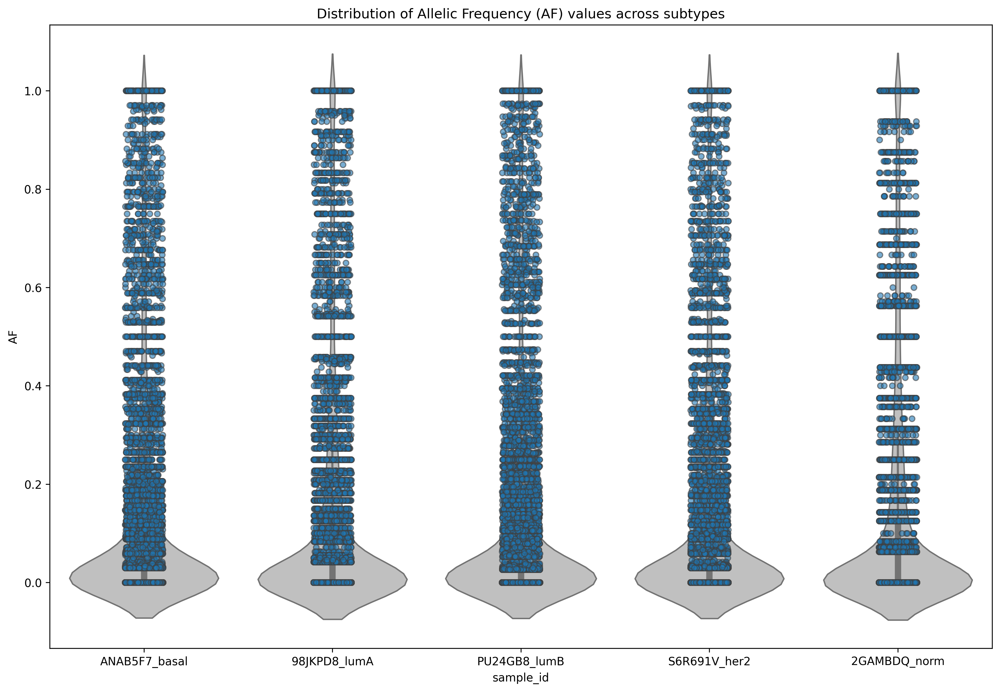

In [16]:
# visualize individual data points using a stripplot and scatterplot
fig, ax = plt.subplots(figsize=(15, 10), dpi=300)
sns.stripplot(x="sample_id", y="AF", data=af_regdf_long, jitter=True, alpha=0.6, linewidth=1, ax=ax)
sns.violinplot(x="sample_id", y="AF", data=af_regdf_long, color='silver', ax=ax)

plt.title("Distribution of Allelic Frequency (AF) values across subtypes")
plt.show()

<Figure size 4500x3000 with 0 Axes>

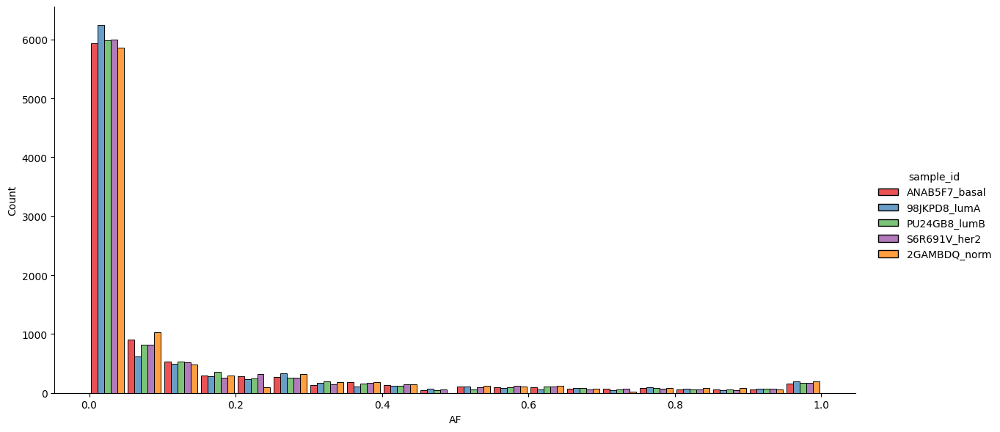

In [16]:
# boxplot with subtypes
plt.figure(figsize=(15, 10), dpi=300)
sns.displot(af_regdf_long, x="AF", hue='sample_id', bins=20, multiple='dodge', shrink=.9, height=6, aspect=2, palette="Set1")

In [17]:
af_region_df[af_region_df == 0].count()

region_id              0
ANAB5F7_basal_AF    4529
98JKPD8_lumA_AF     5425
PU24GB8_lumB_AF     4656
S6R691V_her2_AF     4736
2GAMBDQ_norm_AF     5858
dtype: int64

As seen above, about half of the observations/data points are equal to 0. This suggests a very left-skewed distribution tending towards zero. This makes sense because you would expect that most sites do not have allelic variants (AF = 0 indicates that there are zero reads in the current data that support the alternative allele).

What we can do next is to visualize the summary statistics of the AF distribution after excluding the zero values.

Text(0.5, 1.0, 'Distribution of Allelic Frequency across Called Variants in TFDP1_M08108_2.00 TFBS')

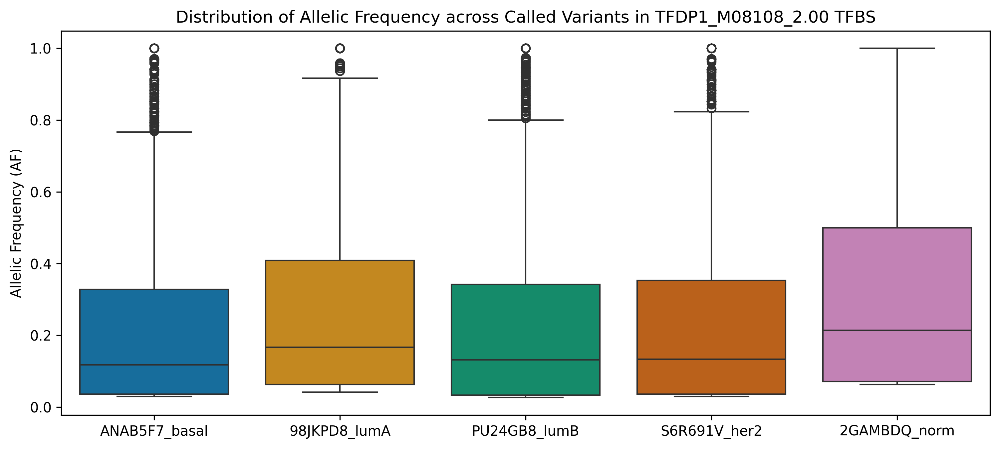

In [17]:
# exclude the zeroes
af_regdf_long_nozero = af_regdf_long[af_regdf_long.AF != 0]

# plot boxplot
plt.figure(figsize=(12,5), dpi=300)
sns.boxplot(data=af_regdf_long_nozero, x='sample_id', y='AF', hue='sample_id', palette='colorblind')

# add labels and title
plt.xlabel('')
plt.ylabel('Allelic Frequency (AF)')
plt.title('Distribution of Allelic Frequency across Called Variants in TFDP1_M08108_2.00 TFBS')


When zeroes are filtered out as shown below in the kernel density estimate plot below, the distribution of AF values that are not zeroes can be seen clearly, though it still remains left-skewed. There seems to be a bump at AF = 0.5. The AF distribution is inherently discretized in the strip plot, which makes sense because AF is a ratio derived from discrete counts of alleles. There is also a bump at AF = 1.0, which indicates that there are binding sites containing alternative allele (mutation) supported by 100% of the observed alleles across samples. They could be known SNPs, or they could be novel mutations associated with BRCA.

In [18]:
af_regdf_long_nozero

,region_id,sample_id,AF
1,chr1:818021-818032,ANAB5F7_basal,0.8125
2,chr1:818780-818791,ANAB5F7_basal,0.0333
4,chr1:977015-977026,ANAB5F7_basal,0.9412
5,chr1:977047-977058,ANAB5F7_basal,0.5000
6,chr1:977110-977121,ANAB5F7_basal,0.8529
...,...,...,...
47791,chrX:153495405-153495416,2GAMBDQ_norm,1.0000
47792,chrX:153642534-153642545,2GAMBDQ_norm,0.0625
47795,chrX:153934861-153934872,2GAMBDQ_norm,0.0625
47797,chrX:155010397-155010408,2GAMBDQ_norm,0.0833


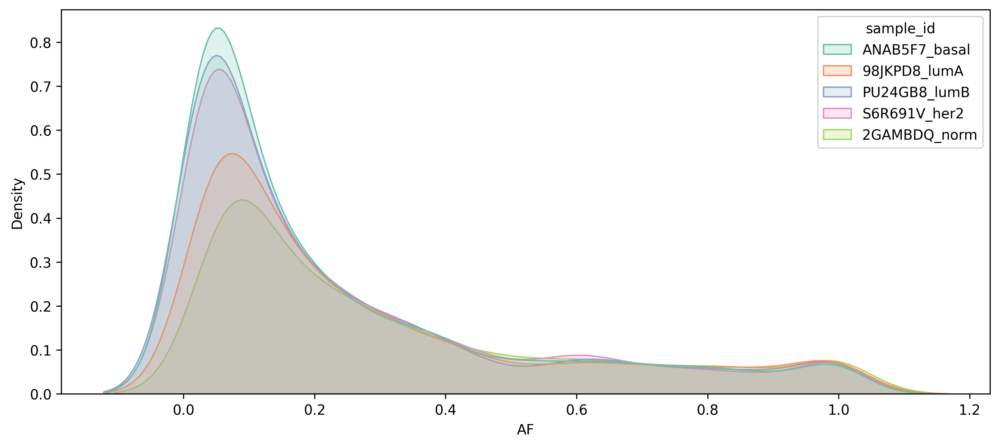

In [20]:
# filter out zero values
plt.figure(figsize=(12,5), dpi=300)
ax = sns.kdeplot(data=af_regdf_long_nozero, x='AF', hue='sample_id', fill=True, alpha=0.2, palette='Set2')

# Show the plot
plt.show()

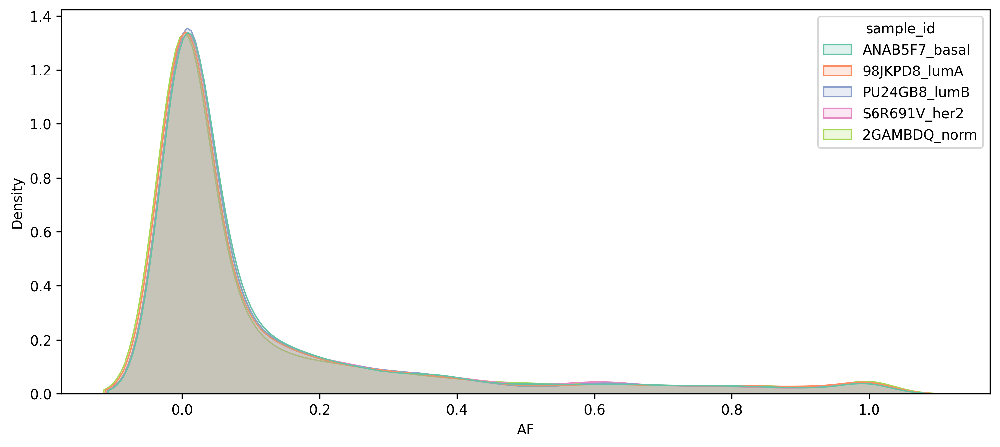

In [21]:
plt.figure(figsize=(12,5), dpi=300)
ax = sns.kdeplot(data=af_regdf_long, x='AF', hue='sample_id', fill=True, alpha=0.2, palette='Set2')

# Show the plot
plt.show()

We can also plot the AF distribution across TFBSs hued by the subtype as a scatterplot. This is to see if there are any differences in the AF distribution across subtypes.

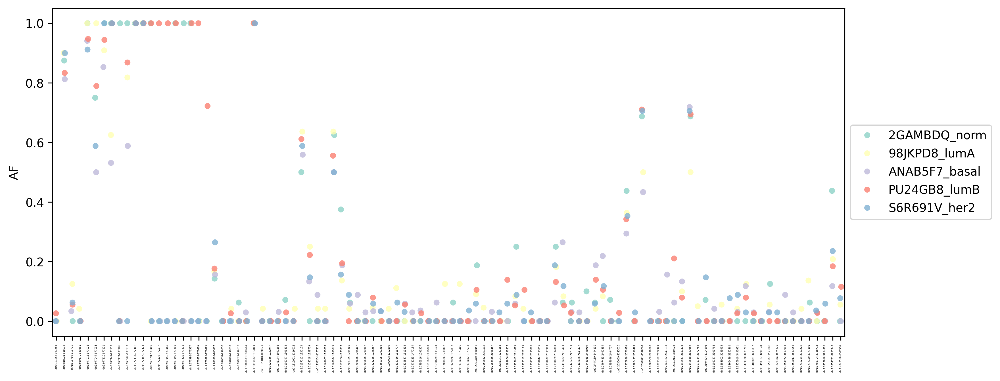

In [26]:
# group the data by 'sample_id' and select the first 100 entries from each group
data_to_plot = af_regdf_long.groupby('sample_id').apply(lambda x: x.head(100)).reset_index(drop=True)

# plot strip plot
plt.figure(figsize=(12,5), dpi=300)
ax = sns.stripplot(data=data_to_plot, y='AF', x='region_id', hue='sample_id', palette='Set3', alpha=0.8)
plt.xlabel("")
plt.xticks(rotation=90, fontsize=2)

# move the legend outside of the plot
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

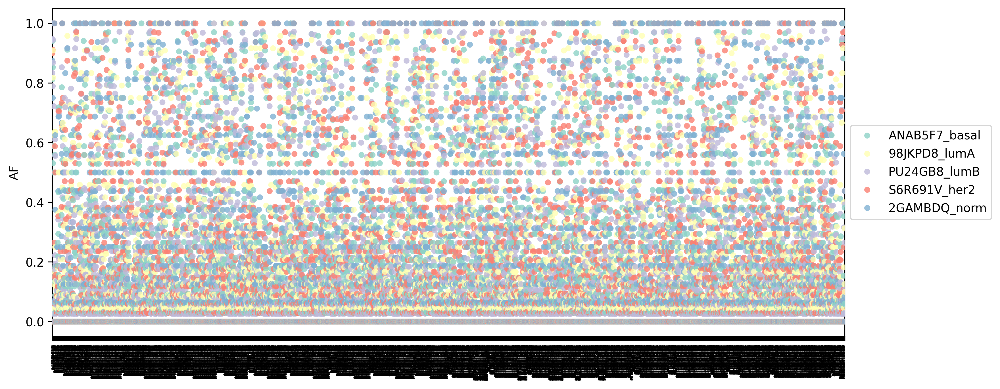

In [27]:
# plot strip plot
plt.figure(figsize=(12,5), dpi=300)
ax = sns.stripplot(data=af_regdf_long, y='AF', x='region_id', hue='sample_id', palette='Set3', alpha=0.8)
plt.xlabel("")
plt.xticks(rotation=90, fontsize=2)

# move the legend outside of the plot
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#### Z-score normalization (AF)
Let's try to normalize the data using Z-score normalization. 

In [19]:
# normalize the data
import scipy.stats as stats

In [20]:
af_region_df

,region_id,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
0,chr1:191257-191268,0.0000,0.0000,0.0263,0.0000,0.0000
1,chr1:818021-818032,0.8125,0.9000,0.8333,0.9000,0.8750
2,chr1:818780-818791,0.0333,0.1250,0.0556,0.0625,0.0000
3,chr1:960570-960581,0.0000,0.0417,0.0000,0.0000,0.0000
4,chr1:977015-977026,0.9412,1.0000,0.9474,0.9118,1.0000
...,...,...,...,...,...,...
9555,chrX:153934861-153934872,0.0000,0.0000,0.0000,0.0000,0.0625
9556,chrX:154444629-154444640,0.0588,0.1250,0.1053,0.0000,0.0000
9557,chrX:155010397-155010408,0.0000,0.3125,0.3929,0.1000,0.0833
9558,chrX:155641610-155641621,0.0000,0.0000,0.0294,0.0000,0.0000


In [30]:
af_region_df.drop(columns='region_id')


,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
0,0.0000,0.0000,0.0263,0.0000,0.0000
1,0.8125,0.9000,0.8333,0.9000,0.8750
2,0.0333,0.1250,0.0556,0.0625,0.0000
3,0.0000,0.0417,0.0000,0.0000,0.0000
4,0.9412,1.0000,0.9474,0.9118,1.0000
...,...,...,...,...,...
9555,0.0000,0.0000,0.0000,0.0000,0.0625
9556,0.0588,0.1250,0.1053,0.0000,0.0000
9557,0.0000,0.3125,0.3929,0.1000,0.0833
9558,0.0000,0.0000,0.0294,0.0000,0.0000


In [31]:
af_region_df.describe()

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
count,9560.0000,9560.0000,9560.0000,9560.0000,9560.0000
mean,0.1244,0.1242,0.1239,0.1260,0.1257
std,0.2257,0.2341,0.2284,0.2290,0.2388
min,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.0000,0.0000,0.0000,0.0000,0.0000
50%,0.0294,0.0000,0.0263,0.0294,0.0000
75%,0.1333,0.1250,0.1316,0.1429,0.1250
max,1.0000,1.0000,1.0000,1.0000,1.0000


Now let's apply the Z-score normalization to the AF data along each column (across the rows, axis = 0). 

In [21]:
af_region_dfz = af_region_df.drop(columns='region_id').apply(stats.zscore, axis=0, ddof=1)

af_region_dfz

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
0,-0.5513,-0.5307,-0.4273,-0.5501,-0.5266
1,3.0479,3.3134,3.1061,3.3806,3.1380
2,-0.4036,0.0032,-0.2993,-0.2772,-0.5266
3,-0.5513,-0.3527,-0.5425,-0.5501,-0.5266
4,3.6179,3.7406,3.6054,3.4320,3.6615
...,...,...,...,...,...
9555,-0.5513,-0.5307,-0.5425,-0.5501,-0.2648
9556,-0.2907,0.0032,-0.0817,-0.5501,-0.5266
9557,-0.5513,0.8041,1.1775,-0.1134,-0.1775
9558,-0.5513,-0.5307,-0.4138,-0.5501,-0.5266


In [22]:
af_region_dfz.describe()

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
count,9560.0000,9560.0000,9560.0000,9560.0000,9560.0000
mean,0.0000,-0.0000,0.0000,-0.0000,-0.0000
std,1.0000,1.0000,1.0000,1.0000,1.0000
min,-0.5513,-0.5307,-0.5425,-0.5501,-0.5266
25%,-0.5513,-0.5307,-0.5425,-0.5501,-0.5266
50%,-0.4210,-0.5307,-0.4273,-0.4217,-0.5266
75%,0.0394,0.0032,0.0336,0.0738,-0.0030
max,3.8785,3.7406,3.8358,3.8173,3.6615


<Axes: ylabel='Density'>

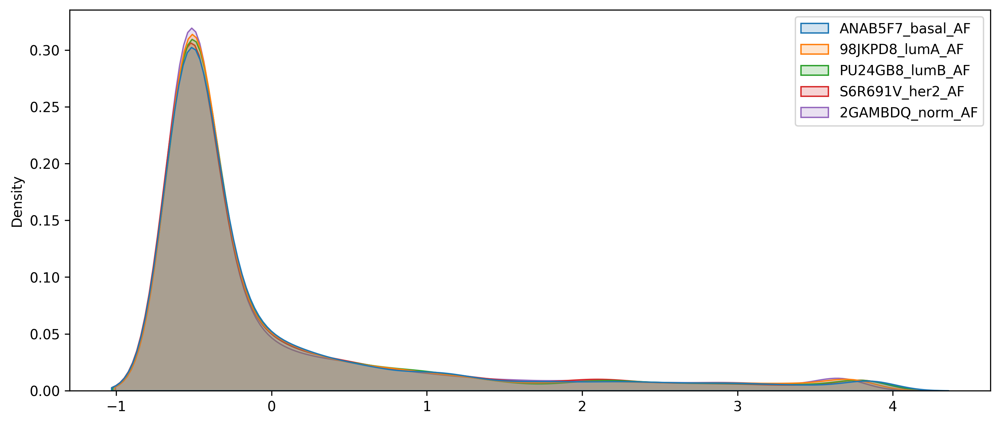

In [23]:
# plot distribution of normalized data
plt.figure(figsize=(12,5), dpi=300)
sns.kdeplot(data=af_region_dfz, fill=True, alpha=0.2)
# sns.kdeplot(data=af_region_df.drop(columns='region_id'), fill=True, alpha=1)

In [63]:
# now filter for rows that contains at least one value greater than or less than 1 standard deviation away from zero
af_region_dfz_filt = af_region_dfz[(af_region_dfz['ANAB5F7_basal_AF'] > 1) |
                                               (af_region_dfz['98JKPD8_lumA_AF'] > 1) |
                                               (af_region_dfz['PU24GB8_lumB_AF'] > 1) |
                                               (af_region_dfz['S6R691V_her2_AF'] > 1) |
                                               (af_region_dfz['2GAMBDQ_norm_AF'] > 1)]
af_region_dfz_filt


,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
1,3.0479,3.3134,3.1061,3.3806,3.1380
4,3.6179,3.7406,3.6054,3.4320,3.6615
5,1.6636,3.7406,2.9141,2.0190,2.6145
6,3.2271,3.3523,3.5926,3.8173,3.6615
7,1.8021,2.1388,3.8358,3.8173,3.6615
...,...,...,...,...,...
9540,3.8785,3.3846,3.3207,3.6889,3.6615
9550,1.0122,1.1778,0.8401,0.5417,1.8293
9551,3.3574,3.7406,3.7206,3.6889,3.6615
9557,-0.5513,0.8041,1.1775,-0.1134,-0.1775


<Axes: ylabel='Density'>

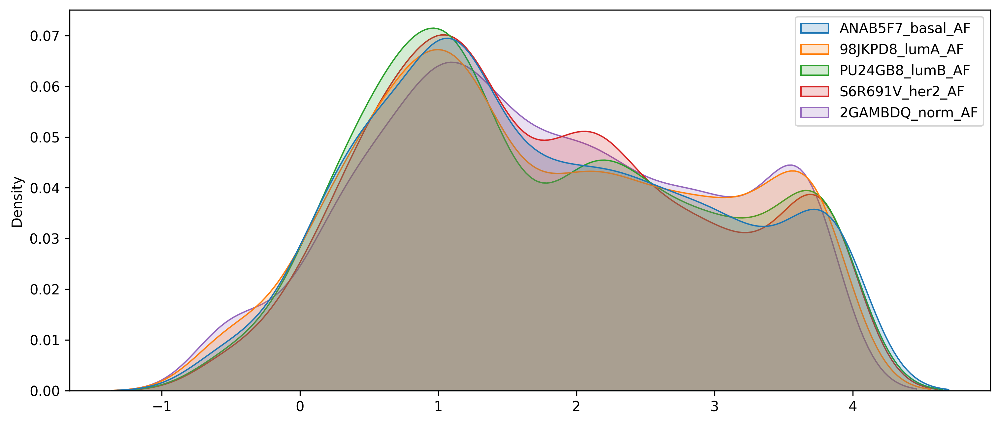

In [64]:
# plot distribution of normalized data
plt.figure(figsize=(12,5), dpi=300)
sns.kdeplot(data=af_region_dfz_filt, fill=True, alpha=0.2)

In [65]:
# merge back the region_id column
af_region_dfz_filt_merged = af_region_dfz_filt.merge(af_region_df[['region_id']], left_index=True, right_index=True)
af_region_dfz_filt_merged

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF,region_id
1,3.0479,3.3134,3.1061,3.3806,3.1380,chr1:818021-818032
4,3.6179,3.7406,3.6054,3.4320,3.6615,chr1:977015-977026
5,1.6636,3.7406,2.9141,2.0190,2.6145,chr1:977047-977058
6,3.2271,3.3523,3.5926,3.8173,3.6615,chr1:977110-977121
7,1.8021,2.1388,3.8358,3.8173,3.6615,chr1:977142-977153
...,...,...,...,...,...,...
9540,3.8785,3.3846,3.3207,3.6889,3.6615,chrX:136147329-136147340
9550,1.0122,1.1778,0.8401,0.5417,1.8293,chrX:153494828-153494839
9551,3.3574,3.7406,3.7206,3.6889,3.6615,chrX:153495405-153495416
9557,-0.5513,0.8041,1.1775,-0.1134,-0.1775,chrX:155010397-155010408


In [66]:
# reorder columns so that region_id is the first column
cols = af_region_dfz_filt_merged.columns.tolist()

cols = [cols[-1]] + cols[:-1]

final_af_dfz = af_region_dfz_filt_merged[cols]
final_af_dfz

# save to file
final_af_dfz.to_csv("TFDP1_M08108_2.00_zscored-AF_filtered_matrix-wide.tsv", sep="\t", index=False, na_rep='NULL')

As the AF data is already bounded between 0 and 1, the Z-score normalization does not change the distribution of the data. The summary statistics between the subtypes are also not very different so we can use AF data as it is for downstream analysis.

### Filtering AF Dataset

In [63]:
af_region_dfn = af_region_df
af_region_dfn

,region_id,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
0,chr1:191257-191268,0.0000,0.0000,0.0263,0.0000,0.0000
1,chr1:818021-818032,0.8125,0.9000,0.8333,0.9000,0.8750
2,chr1:818780-818791,0.0333,0.1250,0.0556,0.0625,0.0000
3,chr1:960570-960581,0.0000,0.0417,0.0000,0.0000,0.0000
4,chr1:977015-977026,0.9412,1.0000,0.9474,0.9118,1.0000
...,...,...,...,...,...,...
9555,chrX:153934861-153934872,0.0000,0.0000,0.0000,0.0000,0.0625
9556,chrX:154444629-154444640,0.0588,0.1250,0.1053,0.0000,0.0000
9557,chrX:155010397-155010408,0.0000,0.3125,0.3929,0.1000,0.0833
9558,chrX:155641610-155641621,0.0000,0.0000,0.0294,0.0000,0.0000


In [64]:
af_region_dfn.describe()

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
count,9560.0000,9560.0000,9560.0000,9560.0000,9560.0000
mean,0.1244,0.1242,0.1239,0.1260,0.1257
std,0.2257,0.2341,0.2284,0.2290,0.2388
min,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.0000,0.0000,0.0000,0.0000,0.0000
50%,0.0294,0.0000,0.0263,0.0294,0.0000
75%,0.1333,0.1250,0.1316,0.1429,0.1250
max,1.0000,1.0000,1.0000,1.0000,1.0000


Split the dataframes into five sub-dataframes with 'region_id' as the common column. Then filter the dataframes to retain only AF values that are greater than 0.5.

In [65]:
# first we need to split the dataframe into 5 dataframes, one for each subtype, with region_id as common column
# get a list of all column names except 'region_id'
cols = [col for col in af_region_dfn.columns if col != 'region_id']
print(cols)
# create a dictionary to store the sub-dataframes
subdfs = {}

# create sub-dataframes
for col in cols:
    subdfs[col] = af_region_dfn[['region_id', col]]
    
subdfs

['ANAB5F7_basal_AF', '98JKPD8_lumA_AF', 'PU24GB8_lumB_AF', 'S6R691V_her2_AF', '2GAMBDQ_norm_AF']


{'ANAB5F7_basal_AF':                      region_id  ANAB5F7_basal_AF
 0           chr1:191257-191268            0.0000
 1           chr1:818021-818032            0.8125
 2           chr1:818780-818791            0.0333
 3           chr1:960570-960581            0.0000
 4           chr1:977015-977026            0.9412
 ...                        ...               ...
 9555  chrX:153934861-153934872            0.0000
 9556  chrX:154444629-154444640            0.0588
 9557  chrX:155010397-155010408            0.0000
 9558  chrX:155641610-155641621            0.0000
 9559    chrY:11108019-11108030            0.3824
 
 [9560 rows x 2 columns],
 '98JKPD8_lumA_AF':                      region_id  98JKPD8_lumA_AF
 0           chr1:191257-191268           0.0000
 1           chr1:818021-818032           0.9000
 2           chr1:818780-818791           0.1250
 3           chr1:960570-960581           0.0417
 4           chr1:977015-977026           1.0000
 ...                        ...        

In [66]:
# filter subdfs for when AF > 0.5
for subtype, df in subdfs.items():
	subdfs[subtype] = df[df[subtype] > 0.5]

subdfs

{'ANAB5F7_basal_AF':                      region_id  ANAB5F7_basal_AF
 1           chr1:818021-818032            0.8125
 4           chr1:977015-977026            0.9412
 6           chr1:977110-977121            0.8529
 7           chr1:977142-977153            0.5312
 9           chr1:977206-977217            0.5882
 ...                        ...               ...
 9529  chrX:128606906-128606917            1.0000
 9530  chrX:128928955-128928966            0.9286
 9532  chrX:130110575-130110586            1.0000
 9540  chrX:136147329-136147340            1.0000
 9551  chrX:153495405-153495416            0.8824
 
 [798 rows x 2 columns],
 '98JKPD8_lumA_AF':                      region_id  98JKPD8_lumA_AF
 1           chr1:818021-818032           0.9000
 4           chr1:977015-977026           1.0000
 5           chr1:977047-977058           1.0000
 6           chr1:977110-977121           0.9091
 7           chr1:977142-977153           0.6250
 ...                        ...         

In [67]:
# define the color palette
palette = sns.color_palette("Set3", 5)
print(palette)

[(0.5529411764705883, 0.8274509803921568, 0.7803921568627451), (1.0, 1.0, 0.7019607843137254), (0.7450980392156863, 0.7294117647058823, 0.8549019607843137), (0.984313725490196, 0.5019607843137255, 0.4470588235294118), (0.5019607843137255, 0.6941176470588235, 0.8274509803921568)]


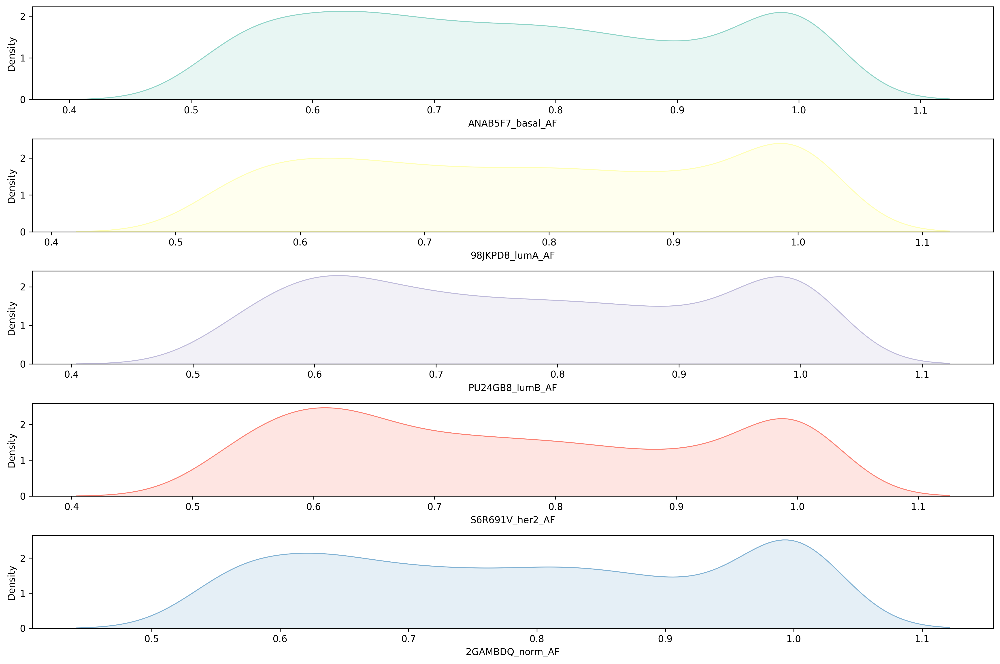

In [68]:
# define plotting regions for subplots
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(15, 10), dpi=300)

# define the color palette
palette = sns.color_palette("Set3", 5)

for index, (subtype, df) in enumerate(subdfs.items()):
	sns.kdeplot(data=df, x=subtype, fill=True, alpha=0.2, ax=axes[index], color=palette[index], legend=True)
	axes[index].set_xlabel(subtype)
  

plt.tight_layout()
plt.show()


In [88]:
# now merge the sub-dataframes back into one dataframe, on region_id, with NaN values filled with -1
from functools import reduce

# assuming subdfs is your dictionary of dataframes
dfs = list(subdfs.values())

# use reduce to merge all dataframes
merged_af_df = reduce(lambda left,right: pd.merge(left,right,on='region_id', how='outer'), dfs)

# fill NaN values with -1
# merged_af_df.fillna(-1, inplace=True)

merged_af_df

,region_id,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
0,chr1:818021-818032,0.8125,0.9000,0.8333,0.9000,0.8750
1,chr1:977015-977026,0.9412,1.0000,0.9474,0.9118,1.0000
2,chr1:977110-977121,0.8529,0.9091,0.9444,1.0000,1.0000
3,chr1:977142-977153,0.5312,0.6250,1.0000,1.0000,1.0000
4,chr1:977206-977217,0.5882,0.8182,0.8684,NaN,1.0000
...,...,...,...,...,...,...
1183,chr22:50261647-50261658,NaN,NaN,NaN,NaN,0.5625
1184,chrX:6708058-6708069,NaN,NaN,NaN,NaN,0.5833
1185,chrX:46447000-46447011,NaN,NaN,NaN,NaN,0.5625
1186,chrX:109749475-109749486,NaN,NaN,NaN,NaN,0.7500


In [89]:
# set region_id as index
merged_af_df_indexed = merged_af_df.set_index('region_id')
merged_af_df_indexed

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
region_id,,,,,
chr1:818021-818032,0.8125,0.9000,0.8333,0.9000,0.8750
chr1:977015-977026,0.9412,1.0000,0.9474,0.9118,1.0000
chr1:977110-977121,0.8529,0.9091,0.9444,1.0000,1.0000
chr1:977142-977153,0.5312,0.6250,1.0000,1.0000,1.0000
chr1:977206-977217,0.5882,0.8182,0.8684,NaN,1.0000
...,...,...,...,...,...
chr22:50261647-50261658,NaN,NaN,NaN,NaN,0.5625
chrX:6708058-6708069,NaN,NaN,NaN,NaN,0.5833
chrX:46447000-46447011,NaN,NaN,NaN,NaN,0.5625


In [91]:
# do the same with the original dataframe
af_region_dfn_indexed = af_region_dfn.set_index('region_id')
af_region_dfn_indexed

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
region_id,,,,,
chr1:191257-191268,0.0000,0.0000,0.0263,0.0000,0.0000
chr1:818021-818032,0.8125,0.9000,0.8333,0.9000,0.8750
chr1:818780-818791,0.0333,0.1250,0.0556,0.0625,0.0000
chr1:960570-960581,0.0000,0.0417,0.0000,0.0000,0.0000
chr1:977015-977026,0.9412,1.0000,0.9474,0.9118,1.0000
...,...,...,...,...,...
chrX:153934861-153934872,0.0000,0.0000,0.0000,0.0000,0.0625
chrX:154444629-154444640,0.0588,0.1250,0.1053,0.0000,0.0000
chrX:155010397-155010408,0.0000,0.3125,0.3929,0.1000,0.0833


Plot the heatmap across unfiltered data first. Then plot the heatmap across filtered data.

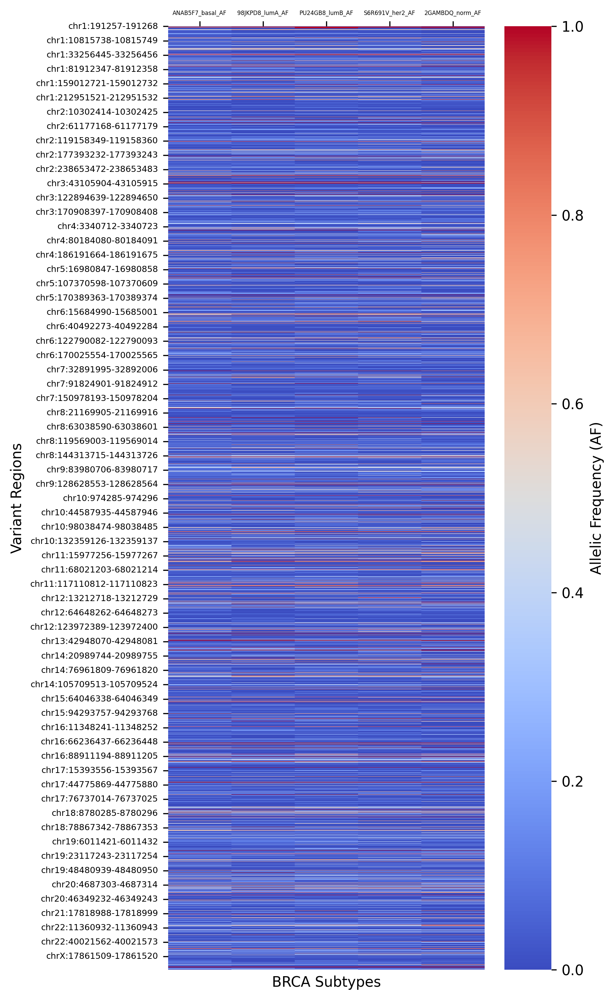

In [97]:
# plot distribution across subtypes as heatmap
plt.figure(figsize=(5,12), dpi=300)
ax = sns.heatmap(data=af_region_dfn_indexed, cmap='coolwarm', cbar_kws={'label': 'Allelic Frequency (AF)'}, center=0.5)
ax.set_ylabel('Variant Regions')
ax.set_xlabel('BRCA Subtypes')
# set smaller font size for column labels
ax.tick_params(axis='x', labelsize=4)
ax.tick_params(axis='y', labelsize=6)
ax.xaxis.tick_top()

plt.show()


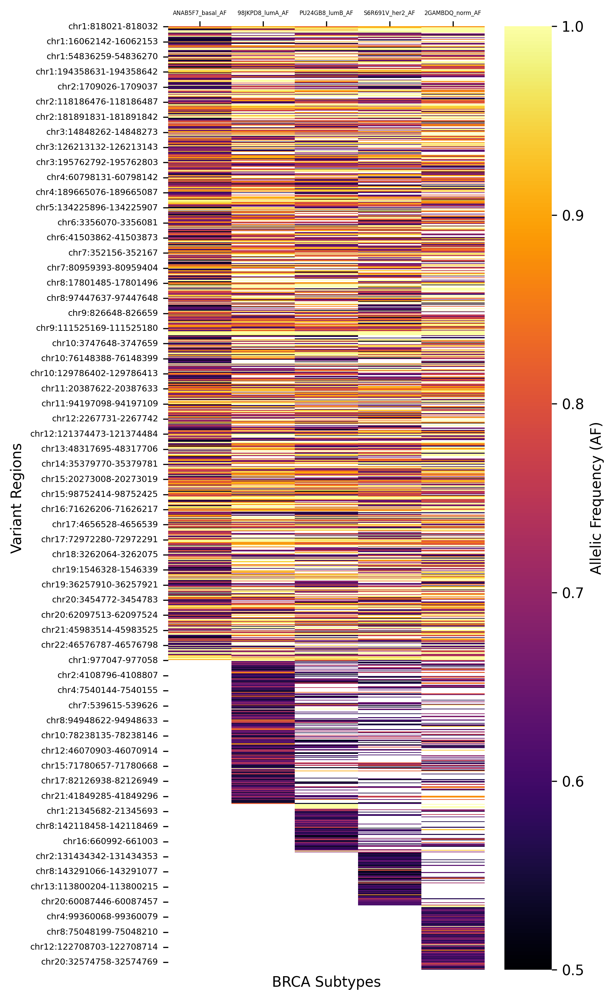

In [100]:
# plot distribution across subtypes as heatmap
plt.figure(figsize=(5,12), dpi=300)
ax = sns.heatmap(data=merged_af_df_indexed, cmap='inferno', cbar_kws={'label': 'Allelic Frequency (AF)'}, vmin=0.5, mask=merged_af_df_indexed.isnull())
ax.set_ylabel('Variant Regions')
ax.set_xlabel('BRCA Subtypes')
# set smaller font size for column labels
ax.tick_params(axis='x', labelsize=4)
ax.tick_params(axis='y', labelsize=6)
ax.xaxis.tick_top()

plt.show()

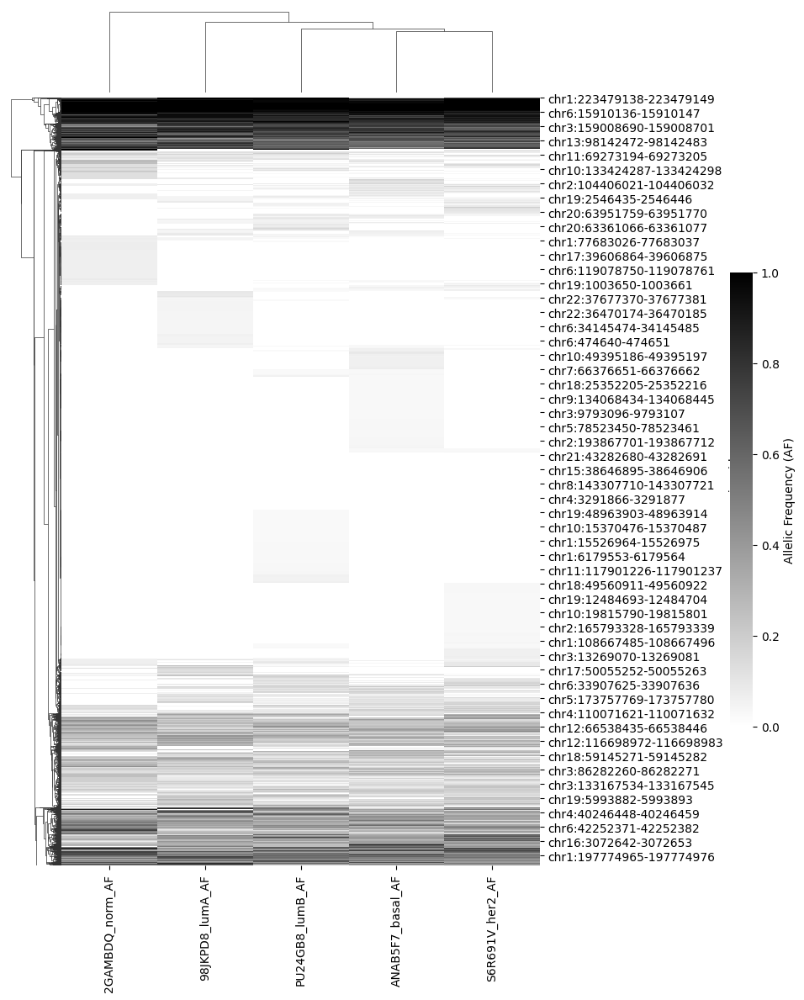

In [107]:
# let's try clustering the data by region_id using clustermap

g = sns.clustermap(data=af_region_dfn_indexed, cmap='binary', cbar_kws={'label': 'Allelic Frequency (AF)'}, center=0.5, figsize=(9,12), dendrogram_ratio=0.1)

# calculate colorbar position
fig_height = g.fig.get_figheight()
cbar_height = 0.45 * fig_height  # 45% of figure height
cbar_bottom = (fig_height - cbar_height) / 2 / fig_height  # center vertically

# reposition colorbar
g.cax.set_position([.97, cbar_bottom, .03, cbar_height / fig_height])


plt.show()


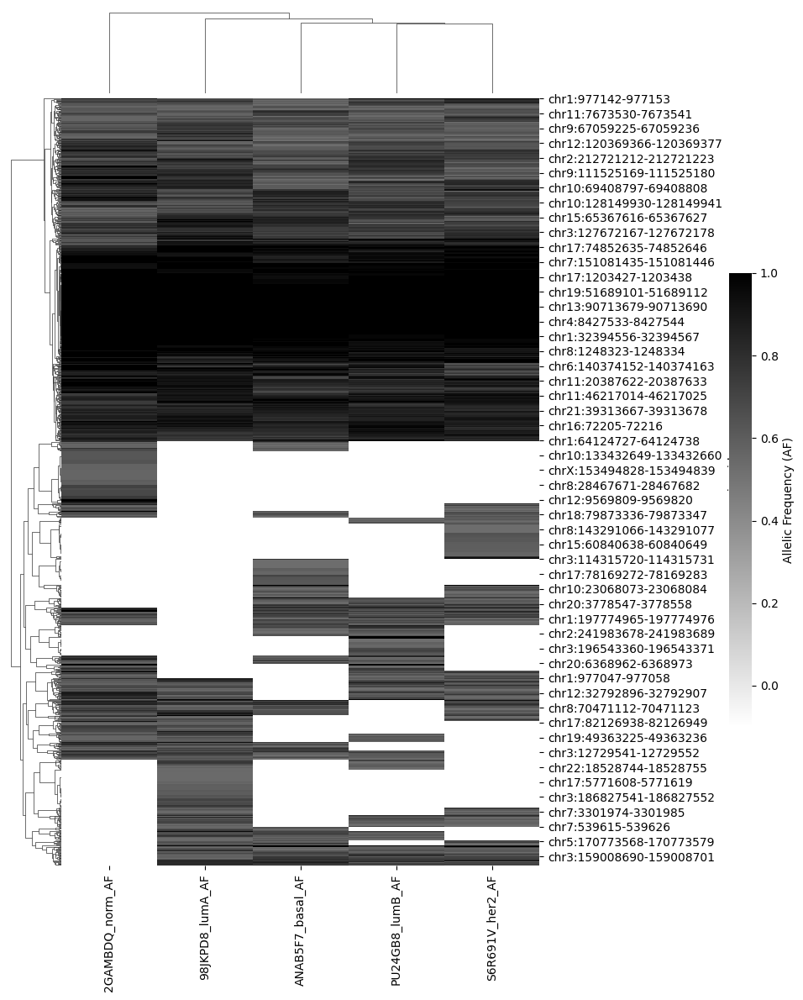

In [112]:
# let's try clustering the data by region_id using clustermap

# first fill NaN values with -0.1
merged_af_df_indexed_fna = merged_af_df_indexed.fillna(-0.1)

g = sns.clustermap(data=merged_af_df_indexed_fna, cmap='binary', cbar_kws={'label': 'Allelic Frequency (AF)'}, figsize=(9,12), dendrogram_ratio=0.1)

# calculate colorbar position
fig_height = g.fig.get_figheight()
cbar_height = 0.45 * fig_height  # 45% of figure height
cbar_bottom = (fig_height - cbar_height) / 2 / fig_height  # center vertically

# reposition colorbar
g.cax.set_position([.97, cbar_bottom, .03, cbar_height / fig_height])


plt.show()

The `merged_af_df_indexed` dataframe will be used to merge with the FPS data. Let's load up the FPS data and merge it with the `merged_af_df_indexed` dataframe.

### Plotting Footprinting Scores (FPS)

Now let's subset the filtered gr object into a dataframe containing only the FPS data. 

Then, we can plot the FPS distribution for each subtype.

In [136]:
# subset the dataframe to gget just the _fps columns
fps_region_df = final_df.filter(regex='_fps$|_id$')
fps_region_df

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,region_id
0,0.0000,0.0000,0.0000,0.0000,0.0000,chr1:191257-191268
1,0.0297,0.0440,0.0213,0.0347,0.0344,chr1:818021-818032
2,0.0257,0.0238,0.0227,0.0281,0.0339,chr1:818780-818791
3,0.2805,0.3350,0.2849,0.2762,0.2299,chr1:960570-960581
4,1.1005,0.5051,0.7104,1.2130,1.3015,chr1:977015-977026
...,...,...,...,...,...,...
9555,0.1967,0.1679,0.1721,0.1905,0.1616,chrX:153934861-153934872
9556,0.0490,0.0743,0.0731,0.0901,0.0423,chrX:154444629-154444640
9557,0.0118,0.0050,0.0088,0.0130,0.0199,chrX:155010397-155010408
9558,0.0125,0.0124,0.0133,0.0149,0.0174,chrX:155641610-155641621


In [137]:
# see summary statistics
fps_region_df.describe()

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
count,9560.0000,9560.0000,9560.0000,9560.0000,9560.0000
mean,0.1556,0.1576,0.1485,0.1620,0.1537
std,0.3098,0.3090,0.3030,0.3298,0.2982
min,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.0180,0.0163,0.0185,0.0193,0.0217
50%,0.0349,0.0372,0.0370,0.0366,0.0379
75%,0.1320,0.1380,0.1219,0.1344,0.1304
max,3.7916,3.9361,7.6509,3.6747,3.7641


In [138]:
# this is actually in a wide format, so we need to melt it into a long format for plotting
fps_df_long = fps_region_df.melt(id_vars=["region_id"], var_name="sample_id", value_name="FPS")
# remove the "_fps" suffix from the "sample_id" column
fps_df_long["sample_id"] = fps_df_long["sample_id"].apply(lambda x: x.replace("_fps", ""))
fps_df_long

,region_id,sample_id,FPS
0,chr1:191257-191268,98JKPD8_lumA,0.0000
1,chr1:818021-818032,98JKPD8_lumA,0.0297
2,chr1:818780-818791,98JKPD8_lumA,0.0257
3,chr1:960570-960581,98JKPD8_lumA,0.2805
4,chr1:977015-977026,98JKPD8_lumA,1.1005
...,...,...,...
47795,chrX:153934861-153934872,2GAMBDQ_norm,0.1616
47796,chrX:154444629-154444640,2GAMBDQ_norm,0.0423
47797,chrX:155010397-155010408,2GAMBDQ_norm,0.0199
47798,chrX:155641610-155641621,2GAMBDQ_norm,0.0174


Text(0.5, 1.0, 'Distribution of Footprinting Scores across Called Variants in TFDP1_M08108_2.00 TFBS')

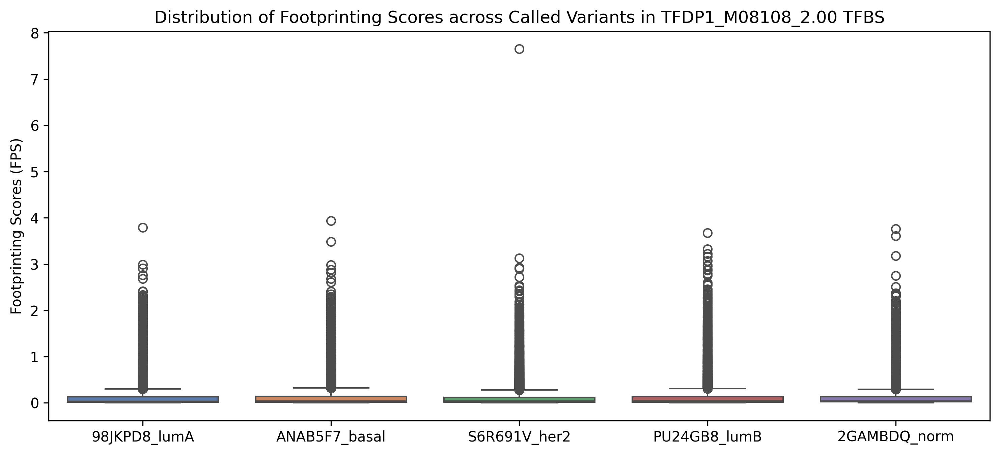

In [139]:
# plot boxplot
plt.figure(figsize=(12,5), dpi=300)
sns.boxplot(data=fps_df_long, x='sample_id', y='FPS', hue='sample_id', palette='deep')

# add labels and title
plt.xlabel('')
plt.ylabel('Footprinting Scores (FPS)')
plt.title('Distribution of Footprinting Scores across Called Variants in TFDP1_M08108_2.00 TFBS')

There is an extreme outlier pushing every data point down to zero. Let's use MinMaxScaler to scale the data to a range between 0 and 1.

In [140]:
from sklearn.preprocessing import MinMaxScaler

In [141]:
# first, set 'region_id' as index
fps_region_df_indexed = fps_region_df.set_index('region_id')
fps_region_df_indexed

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
region_id,,,,,
chr1:191257-191268,0.0000,0.0000,0.0000,0.0000,0.0000
chr1:818021-818032,0.0297,0.0440,0.0213,0.0347,0.0344
chr1:818780-818791,0.0257,0.0238,0.0227,0.0281,0.0339
chr1:960570-960581,0.2805,0.3350,0.2849,0.2762,0.2299
chr1:977015-977026,1.1005,0.5051,0.7104,1.2130,1.3015
...,...,...,...,...,...
chrX:153934861-153934872,0.1967,0.1679,0.1721,0.1905,0.1616
chrX:154444629-154444640,0.0490,0.0743,0.0731,0.0901,0.0423
chrX:155010397-155010408,0.0118,0.0050,0.0088,0.0130,0.0199


In [142]:
# set scaler object to scale values between 0 and 1
scaler = MinMaxScaler(feature_range=(0, 1))

fps_region_df_indx_scaled = scaler.fit_transform(fps_region_df_indexed)

# convert back to dataframe
fps_region_df_indx_scaled = pd.DataFrame(fps_region_df_indx_scaled, columns=fps_region_df_indexed.columns, index=fps_region_df_indexed.index)
fps_region_df_indx_scaled

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
region_id,,,,,
chr1:191257-191268,0.0000,0.0000,0.0000,0.0000,0.0000
chr1:818021-818032,0.0078,0.0112,0.0028,0.0094,0.0091
chr1:818780-818791,0.0068,0.0060,0.0030,0.0077,0.0090
chr1:960570-960581,0.0740,0.0851,0.0372,0.0752,0.0611
chr1:977015-977026,0.2902,0.1283,0.0928,0.3301,0.3458
...,...,...,...,...,...
chrX:153934861-153934872,0.0519,0.0427,0.0225,0.0518,0.0429
chrX:154444629-154444640,0.0129,0.0189,0.0096,0.0245,0.0112
chrX:155010397-155010408,0.0031,0.0013,0.0011,0.0035,0.0053


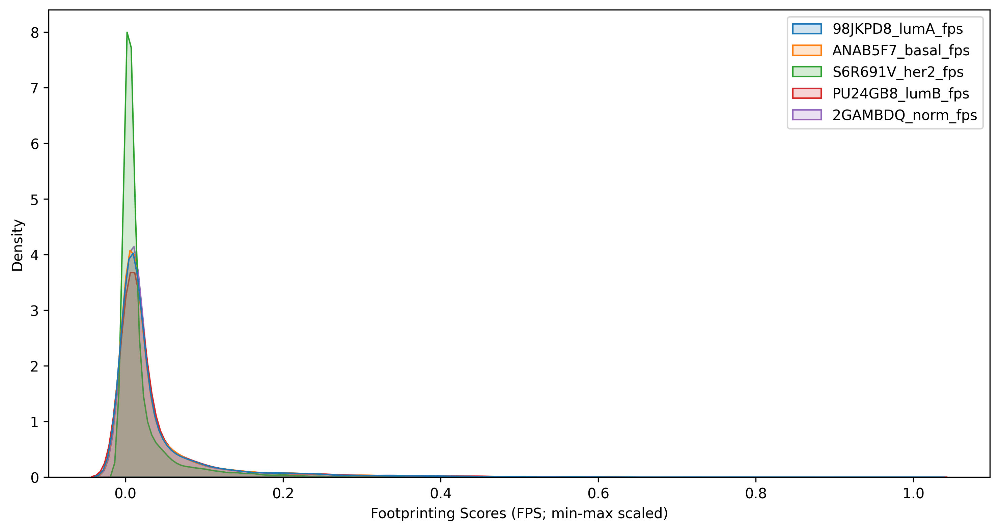

In [143]:
# plot distribution across subtypes as kdeplot
plt.figure(figsize=(12,6), dpi=300)
ax = sns.kdeplot(data=fps_region_df_indx_scaled, fill=True, alpha=0.2)
ax.set_xlabel('Footprinting Scores (FPS; min-max scaled)')

plt.show()

In [144]:
fps_region_df_indx_scaled.describe()

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
count,9560.0000,9560.0000,9560.0000,9560.0000,9560.0000
mean,0.0410,0.0401,0.0194,0.0441,0.0408
std,0.0817,0.0785,0.0396,0.0897,0.0792
min,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.0047,0.0041,0.0024,0.0053,0.0058
50%,0.0092,0.0094,0.0048,0.0100,0.0101
75%,0.0348,0.0350,0.0159,0.0366,0.0346
max,1.0000,1.0000,1.0000,1.0000,1.0000


The skewed distribution and the extreme outlier makes deciding a cutoff based on the mean value quite tricky. Let's use the interquartile range; anything above the 75th percentile and below the 25th percentile will be considered interesting.



In [145]:
# Let's set a lower threshold of 0.005 and upper threshold of 0.04
# first we need to split the dataframe into 5 dataframes, one for each subtype, with region_id as index
# get a list of all column names
cols = [col for col in fps_region_df_indx_scaled.columns]
print(cols)
# create a dictionary to store the sub-dataframes
subarrs = {}

# create sub-dataframes
for col in cols:
    # split the column name by the underscore character and then remove _fps suffix
    subarrs[col] = fps_region_df_indx_scaled[col]
    
subarrs

['98JKPD8_lumA_fps', 'ANAB5F7_basal_fps', 'S6R691V_her2_fps', 'PU24GB8_lumB_fps', '2GAMBDQ_norm_fps']


{'98JKPD8_lumA_fps': region_id
 chr1:191257-191268         0.0000
 chr1:818021-818032         0.0078
 chr1:818780-818791         0.0068
 chr1:960570-960581         0.0740
 chr1:977015-977026         0.2902
                             ...  
 chrX:153934861-153934872   0.0519
 chrX:154444629-154444640   0.0129
 chrX:155010397-155010408   0.0031
 chrX:155641610-155641621   0.0033
 chrY:11108019-11108030     0.0000
 Name: 98JKPD8_lumA_fps, Length: 9560, dtype: float64,
 'ANAB5F7_basal_fps': region_id
 chr1:191257-191268         0.0000
 chr1:818021-818032         0.0112
 chr1:818780-818791         0.0060
 chr1:960570-960581         0.0851
 chr1:977015-977026         0.1283
                             ...  
 chrX:153934861-153934872   0.0427
 chrX:154444629-154444640   0.0189
 chrX:155010397-155010408   0.0013
 chrX:155641610-155641621   0.0032
 chrY:11108019-11108030     0.0000
 Name: ANAB5F7_basal_fps, Length: 9560, dtype: float64,
 'S6R691V_her2_fps': region_id
 chr1:191257-191268      

In [146]:
# filter sub-arrays for when FPS < 0.005 or > 0.04
for subtype, arr in subarrs.items():
	mask = (arr < 0.005) | (arr > 0.04)
	subarrs[subtype] = arr[mask]

subarrs

{'98JKPD8_lumA_fps': region_id
 chr1:191257-191268         0.0000
 chr1:960570-960581         0.0740
 chr1:977015-977026         0.2902
 chr1:977047-977058         0.2326
 chr1:977174-977185         0.0596
                             ...  
 chrX:153885794-153885805   0.0050
 chrX:153934861-153934872   0.0519
 chrX:155010397-155010408   0.0031
 chrX:155641610-155641621   0.0033
 chrY:11108019-11108030     0.0000
 Name: 98JKPD8_lumA_fps, Length: 4837, dtype: float64,
 'ANAB5F7_basal_fps': region_id
 chr1:191257-191268         0.0000
 chr1:960570-960581         0.0851
 chr1:977015-977026         0.1283
 chr1:977047-977058         0.1041
 chr1:977330-977341         0.0475
                             ...  
 chrX:150364541-150364552   0.0435
 chrX:153934861-153934872   0.0427
 chrX:155010397-155010408   0.0013
 chrX:155641610-155641621   0.0032
 chrY:11108019-11108030     0.0000
 Name: ANAB5F7_basal_fps, Length: 5186, dtype: float64,
 'S6R691V_her2_fps': region_id
 chr1:191257-191268      

In [147]:
# convert arrays to Series and combine into one DataFrame
fps_region_scaled_filt_df = pd.concat({k: pd.Series(v) for k, v in subarrs.items()}, axis=1)
fps_region_scaled_filt_df

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
region_id,,,,,
chr1:191257-191268,0.0000,0.0000,0.0000,0.0000,0.0000
chr1:960570-960581,0.0740,0.0851,NaN,0.0752,0.0611
chr1:977015-977026,0.2902,0.1283,0.0928,0.3301,0.3458
chr1:977047-977058,0.2326,0.1041,0.0695,0.2684,0.2845
chr1:977174-977185,0.0596,NaN,NaN,0.0662,0.0593
...,...,...,...,...,...
chr19:50489791-50489802,NaN,NaN,NaN,NaN,0.0050
chr21:42569918-42569929,NaN,NaN,NaN,NaN,0.0403
chr22:23315688-23315699,NaN,NaN,NaN,NaN,0.0406


Now we can explore both the AF (`merged_af_df_indexed`) and FPS dataframes (`fps_region_scaled_filt_df`).

In [148]:
merged_af_df_indexed

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
region_id,,,,,
chr1:818021-818032,0.8125,0.9000,0.8333,0.9000,0.8750
chr1:977015-977026,0.9412,1.0000,0.9474,0.9118,1.0000
chr1:977110-977121,0.8529,0.9091,0.9444,1.0000,1.0000
chr1:977142-977153,0.5312,0.6250,1.0000,1.0000,1.0000
chr1:977206-977217,0.5882,0.8182,0.8684,NaN,1.0000
...,...,...,...,...,...
chr22:50261647-50261658,NaN,NaN,NaN,NaN,0.5625
chrX:6708058-6708069,NaN,NaN,NaN,NaN,0.5833
chrX:46447000-46447011,NaN,NaN,NaN,NaN,0.5625


In [149]:
fps_region_scaled_filt_df

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
region_id,,,,,
chr1:191257-191268,0.0000,0.0000,0.0000,0.0000,0.0000
chr1:960570-960581,0.0740,0.0851,NaN,0.0752,0.0611
chr1:977015-977026,0.2902,0.1283,0.0928,0.3301,0.3458
chr1:977047-977058,0.2326,0.1041,0.0695,0.2684,0.2845
chr1:977174-977185,0.0596,NaN,NaN,0.0662,0.0593
...,...,...,...,...,...
chr19:50489791-50489802,NaN,NaN,NaN,NaN,0.0050
chr21:42569918-42569929,NaN,NaN,NaN,NaN,0.0403
chr22:23315688-23315699,NaN,NaN,NaN,NaN,0.0406


In [154]:
# merge the two dataframes on region_id row index
merged_af_fps_df = pd.merge(merged_af_df_indexed, fps_region_scaled_filt_df, left_index=True, right_index=True, how='outer')
merged_af_fps_df

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
region_id,,,,,,,,,,
chr10:100346639-100346650,NaN,NaN,NaN,NaN,NaN,NaN,0.0453,NaN,0.0800,0.0507
chr10:100913330-100913341,NaN,NaN,NaN,NaN,NaN,0.2066,0.1756,0.1027,0.2091,0.1914
chr10:1010727-1010738,NaN,NaN,NaN,NaN,NaN,0.0038,NaN,0.0026,NaN,NaN
chr10:101089689-101089700,NaN,NaN,NaN,NaN,NaN,NaN,0.0036,NaN,NaN,NaN
chr10:101219312-101219323,NaN,NaN,NaN,NaN,0.5833,0.0046,0.0043,0.0024,NaN,0.0042
...,...,...,...,...,...,...,...,...,...,...
chrX:9786341-9786352,NaN,NaN,NaN,NaN,NaN,0.0510,NaN,NaN,0.0577,NaN
chrX:9786385-9786396,NaN,NaN,NaN,NaN,NaN,0.0493,NaN,NaN,0.0561,0.0437
chrX:9895379-9895390,NaN,NaN,NaN,NaN,NaN,NaN,0.0034,0.0019,0.0043,0.0038


In [155]:
merged_af_fps_df.to_csv("TFDP1_M08108_2.00_af-fps_filt-test.tsv", sep="\t", index=True, na_rep='NULL')

In [160]:
# now get column names
cols = [col for col in merged_af_fps_df.columns]
print(cols)
# truncate the column names to get the sample_id
sample_ids = {col.split('_')[0] + '_' + col.split('_')[1] for col in cols}
print(sample_ids)


['ANAB5F7_basal_AF', '98JKPD8_lumA_AF', 'PU24GB8_lumB_AF', 'S6R691V_her2_AF', '2GAMBDQ_norm_AF', '98JKPD8_lumA_fps', 'ANAB5F7_basal_fps', 'S6R691V_her2_fps', 'PU24GB8_lumB_fps', '2GAMBDQ_norm_fps']
{'2GAMBDQ_norm', 'S6R691V_her2', 'ANAB5F7_basal', '98JKPD8_lumA', 'PU24GB8_lumB'}


In [163]:
# convert to long format
merged_af_fps_df_long = merged_af_fps_df.reset_index().melt(id_vars=["region_id"], var_name="variable", value_name="value")
# split the variable column into sample_id and type columns
merged_af_fps_df_long[['sample_id', 'type']] = merged_af_fps_df_long['variable'].str.rsplit('_', n=1, expand=True)
# drop the variable column
merged_af_fps_df_long = merged_af_fps_df_long.drop(columns=["variable"])

merged_af_fps_df_long





,region_id,value,sample_id,type
0,chr10:100346639-100346650,NaN,ANAB5F7_basal,AF
1,chr10:100913330-100913341,NaN,ANAB5F7_basal,AF
2,chr10:1010727-1010738,NaN,ANAB5F7_basal,AF
3,chr10:101089689-101089700,NaN,ANAB5F7_basal,AF
4,chr10:101219312-101219323,NaN,ANAB5F7_basal,AF
...,...,...,...,...
78545,chrX:9786341-9786352,NaN,2GAMBDQ_norm,fps
78546,chrX:9786385-9786396,0.0437,2GAMBDQ_norm,fps
78547,chrX:9895379-9895390,0.0038,2GAMBDQ_norm,fps
78548,chrX:9905569-9905580,NaN,2GAMBDQ_norm,fps


In [165]:
# pivot the dataframe to create new columns based on the type column
merged_af_fps_df_long_pvt = merged_af_fps_df_long.pivot(index=['region_id', 'sample_id'], columns='type', values='value').reset_index()

# rename the columns to match the type values
merged_af_fps_df_long_pvt = merged_af_fps_df_long_pvt.rename(columns={'fps': 'FPS', 'AF': 'AF'})
merged_af_fps_df_long_pvt

# fps_af_df_pvt.to_csv("TFDP1_M08108_2.00_zscored-FPS_AF_filtered_matrix-long.tsv", sep="\t", index=False, na_rep='NULL')

type,region_id,sample_id,AF,FPS
0,chr10:100346639-100346650,2GAMBDQ_norm,NaN,0.0507
1,chr10:100346639-100346650,98JKPD8_lumA,NaN,NaN
2,chr10:100346639-100346650,ANAB5F7_basal,NaN,0.0453
3,chr10:100346639-100346650,PU24GB8_lumB,NaN,0.0800
4,chr10:100346639-100346650,S6R691V_her2,NaN,NaN
...,...,...,...,...
39270,chrY:11108019-11108030,2GAMBDQ_norm,NaN,0.0000
39271,chrY:11108019-11108030,98JKPD8_lumA,NaN,0.0000
39272,chrY:11108019-11108030,ANAB5F7_basal,NaN,0.0000
39273,chrY:11108019-11108030,PU24GB8_lumB,NaN,0.0000


Try filtering for everything at AF > 0.5 and see how many rows are left.

In [57]:
# filter df for when all columns > 0.5
af_region_dfn_filt_or = af_region_dfn[(af_region_dfn['ANAB5F7_basal_AF'] > 0.5) | (af_region_dfn['98JKPD8_lumA_AF'] > 0.5) | (af_region_dfn['PU24GB8_lumB_AF'] > 0.5) | (af_region_dfn['S6R691V_her2_AF'] > 0.5) | (af_region_dfn['2GAMBDQ_norm_AF'] > 0.5)]
af_region_dfn_filt_or

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
1,0.8125,0.9000,0.8333,0.9000,0.8750
4,0.9412,1.0000,0.9474,0.9118,1.0000
5,0.5000,1.0000,0.7895,0.5882,0.7500
6,0.8529,0.9091,0.9444,1.0000,1.0000
7,0.5312,0.6250,1.0000,1.0000,1.0000
...,...,...,...,...,...
9530,0.9286,0.8333,0.9500,0.9286,1.0000
9532,1.0000,1.0000,1.0000,1.0000,1.0000
9540,1.0000,0.9167,0.8824,0.9706,1.0000
9550,0.3529,0.4000,0.3158,0.2500,0.5625


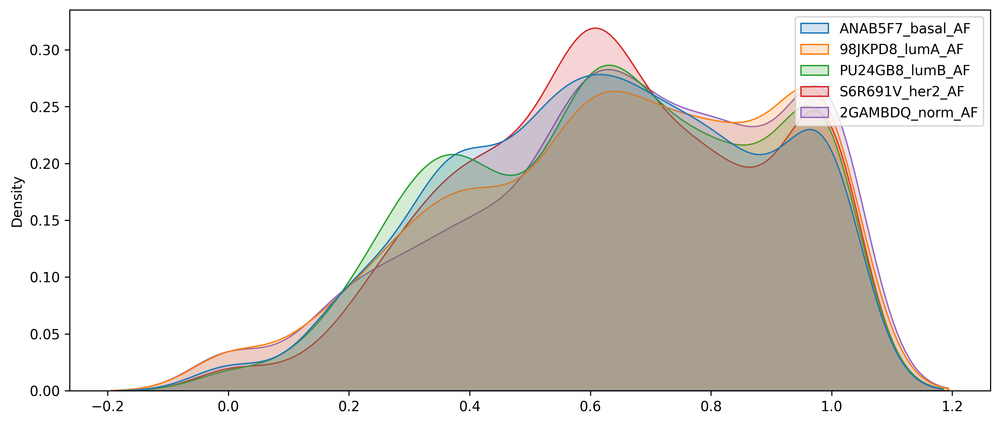

In [58]:
# kde plot
plt.figure(figsize=(12,5), dpi=300)
ax = sns.kdeplot(data=af_region_dfn_filt_or, fill=True, alpha=0.2)

In [59]:
# merge back the region_id column
af_region_dfn_filt_or_merged = af_region_dfn_filt_or.merge(af_region_df[['region_id']], left_index=True, right_index=True)
af_region_dfn_filt_or_merged

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF,region_id
1,0.8125,0.9000,0.8333,0.9000,0.8750,chr1:818021-818032
4,0.9412,1.0000,0.9474,0.9118,1.0000,chr1:977015-977026
5,0.5000,1.0000,0.7895,0.5882,0.7500,chr1:977047-977058
6,0.8529,0.9091,0.9444,1.0000,1.0000,chr1:977110-977121
7,0.5312,0.6250,1.0000,1.0000,1.0000,chr1:977142-977153
...,...,...,...,...,...,...
9530,0.9286,0.8333,0.9500,0.9286,1.0000,chrX:128928955-128928966
9532,1.0000,1.0000,1.0000,1.0000,1.0000,chrX:130110575-130110586
9540,1.0000,0.9167,0.8824,0.9706,1.0000,chrX:136147329-136147340
9550,0.3529,0.4000,0.3158,0.2500,0.5625,chrX:153494828-153494839


In [60]:
# reorder columns so that region_id is the first column
cols = af_region_dfn_filt_or_merged.columns.tolist()

cols = [cols[-1]] + cols[:-1]

final_af_dfn = af_region_dfn_filt_or_merged[cols]
final_af_dfn

# save to file
final_af_dfn.to_csv("TFDP1_M08108_2.00_unnormed-AF_filtered_matrix-wide.tsv", sep="\t", index=False, na_rep='NULL')

In [49]:
fps_region_dfz = fps_region_df.drop(columns='region_id').apply(stats.zscore, axis=0, ddof=1)
fps_region_dfz

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
0,-0.5021,-0.5101,-0.4901,-0.4913,-0.5153
1,-0.4064,-0.3678,-0.4198,-0.3861,-0.3998
2,-0.4191,-0.4332,-0.4152,-0.4060,-0.4016
3,0.4032,0.5739,0.4504,0.3462,0.2555
4,3.0499,1.1244,1.8544,3.1870,3.8493
...,...,...,...,...,...
9555,0.1328,0.0332,0.0780,0.0862,0.0267
9556,-0.3439,-0.2696,-0.2489,-0.2180,-0.3733
9557,-0.4641,-0.4940,-0.4612,-0.4519,-0.4486
9558,-0.4618,-0.4699,-0.4463,-0.4461,-0.4569


In [50]:
fps_region_dfz.describe()

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
count,9560.0000,9560.0000,9560.0000,9560.0000,9560.0000
mean,0.0000,-0.0000,-0.0000,-0.0000,-0.0000
std,1.0000,1.0000,1.0000,1.0000,1.0000
min,-0.5021,-0.5101,-0.4901,-0.4913,-0.5153
25%,-0.4441,-0.4574,-0.4289,-0.4326,-0.4426
50%,-0.3896,-0.3898,-0.3680,-0.3804,-0.3882
75%,-0.0760,-0.0637,-0.0878,-0.0838,-0.0779
max,11.7361,12.2262,24.7620,10.6514,12.1073


<Axes: ylabel='Density'>

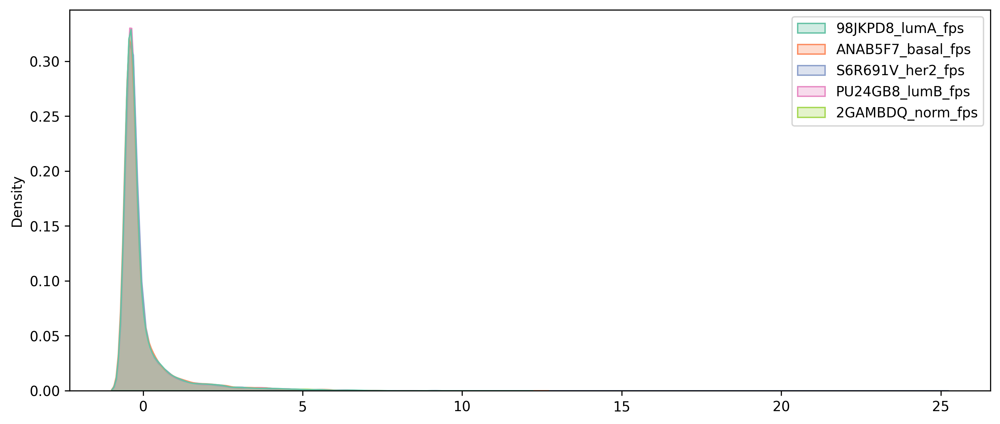

In [51]:
# plot density plot
plt.figure(figsize=(12,5), dpi=300)
sns.kdeplot(data=fps_region_dfz, fill=True, alpha=0.3, palette='Set2')
# sns.kdeplot(data=fps_region_df.drop(columns='region_id'), fill=True, alpha=0.8, palette='Set2')

<Axes: >

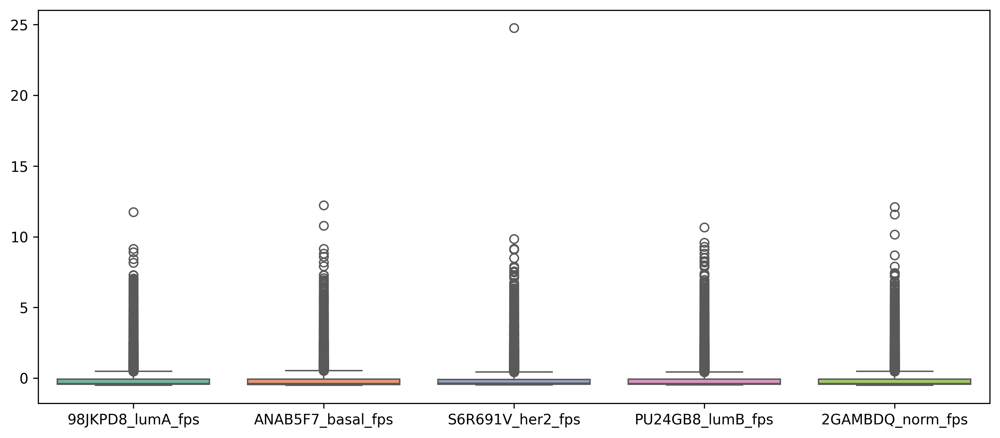

In [52]:
# boxplot
plt.figure(figsize=(12,5), dpi=300)
# sns.boxplot(data=fps_region_df_norm, palette='Set2')

sns.boxplot(data=fps_region_dfz, palette='Set2')

In [86]:
# now filter for rows that contains at least one value greater than or less than 1 standard deviation away from zero
fps_region_dfz_filt = fps_region_dfz[(np.abs(fps_region_dfz['ANAB5F7_basal_fps'] > 1)) |
                                               (np.abs(fps_region_dfz['98JKPD8_lumA_fps'] > 1)) |
                                               (np.abs(fps_region_dfz['PU24GB8_lumB_fps'] > 1)) |
                                               (np.abs(fps_region_dfz['S6R691V_her2_fps'] > 1)) |
                                               (np.abs(fps_region_dfz['2GAMBDQ_norm_fps'] > 1))]
fps_region_dfz_filt

# save temp file
# af_region_df_norm_filtered.to_csv("temp.tsv", sep="\t", index=False, na_rep='NULL')

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
1,-0.3820,1.3514,-1.3921,0.2277,0.1950
2,-0.2531,-0.6928,-0.9284,0.2899,1.5843
3,-0.0222,1.4393,0.0981,-0.1369,-1.3782
5,0.3645,-1.2636,-0.8429,0.7249,1.0171
6,0.0516,-1.2414,-0.7305,1.1588,0.7614
...,...,...,...,...,...
9554,-0.6429,1.1783,-0.5855,0.9879,-0.9378
9555,1.2559,-0.6536,-0.3738,0.8422,-1.0707
9556,-0.8517,0.4339,0.3709,1.2375,-1.1905
9557,0.0184,-1.2109,-0.5275,0.2372,1.4828


<Axes: ylabel='Density'>

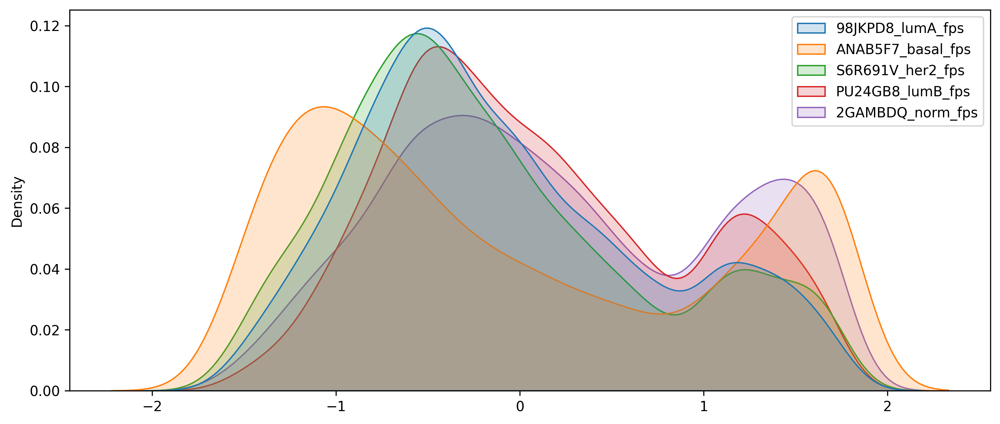

In [87]:
# plot distribution of normalized data
plt.figure(figsize=(12,5), dpi=300)
sns.kdeplot(data=fps_region_dfz_filt, fill=True, alpha=0.2)

In [88]:
# merge back the region_id column
fps_region_dfz_filt_merged = fps_region_dfz_filt.merge(fps_region_df[['region_id']], left_index=True, right_index=True)
fps_region_dfz_filt_merged

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,region_id
1,-0.3820,1.3514,-1.3921,0.2277,0.1950,chr1:818021-818032
2,-0.2531,-0.6928,-0.9284,0.2899,1.5843,chr1:818780-818791
3,-0.0222,1.4393,0.0981,-0.1369,-1.3782,chr1:960570-960581
5,0.3645,-1.2636,-0.8429,0.7249,1.0171,chr1:977047-977058
6,0.0516,-1.2414,-0.7305,1.1588,0.7614,chr1:977110-977121
...,...,...,...,...,...,...
9554,-0.6429,1.1783,-0.5855,0.9879,-0.9378,chrX:153885794-153885805
9555,1.2559,-0.6536,-0.3738,0.8422,-1.0707,chrX:153934861-153934872
9556,-0.8517,0.4339,0.3709,1.2375,-1.1905,chrX:154444629-154444640
9557,0.0184,-1.2109,-0.5275,0.2372,1.4828,chrX:155010397-155010408


In [90]:
# reorder columns so that region_id is the first column
cols = fps_region_dfz_filt_merged.columns.tolist()

cols = [cols[-1]] + cols[:-1]

final_fps_dfz = fps_region_dfz_filt_merged[cols]
final_fps_dfz

# save to file
final_fps_dfz.to_csv("TFDP1_M08108_2.00_zscored-FPS_filtered_matrix-wide.tsv", sep="\t", index=False, na_rep='NULL')

#### Merging the AF and FPS dataframes
The filtered AF and FPS dataframes can be merged together using the `merge()` method.

In [91]:
# merge fps and af dataframes
fps_af_df = final_fps_dfz.merge(final_af_dfn, on='region_id')
fps_af_df

,region_id,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
0,chr1:818021-818032,-0.3820,1.3514,-1.3921,0.2277,0.1950,0.8125,0.9000,0.8333,0.9000,0.8750
1,chr1:977047-977058,0.3645,-1.2636,-0.8429,0.7249,1.0171,0.5000,1.0000,0.7895,0.5882,0.7500
2,chr1:977110-977121,0.0516,-1.2414,-0.7305,1.1588,0.7614,0.8529,0.9091,0.9444,1.0000,1.0000
3,chr1:977142-977153,0.4104,-1.1466,-0.8939,1.2561,0.3741,0.5312,0.6250,1.0000,1.0000,1.0000
4,chr1:977426-977437,0.3948,-1.3838,-0.6692,1.0598,0.5985,0.0000,0.0000,1.0000,0.0000,0.0000
...,...,...,...,...,...,...,...,...,...,...,...
994,chrX:128928955-128928966,-0.2778,0.3818,1.4989,-1.1518,-0.4512,0.9286,0.8333,0.9500,0.9286,1.0000
995,chrX:130110575-130110586,-0.9948,0.8606,-0.9823,1.1419,-0.0254,1.0000,1.0000,1.0000,1.0000,1.0000
996,chrX:136147329-136147340,-0.9635,1.5049,-0.8491,0.0151,0.2926,1.0000,0.9167,0.8824,0.9706,1.0000
997,chrX:153494828-153494839,-0.7194,1.6761,-0.5287,-0.6027,0.1747,0.3529,0.4000,0.3158,0.2500,0.5625


In [92]:
fps_af_df.describe()

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
count,999.0000,999.0000,999.0000,999.0000,999.0000,999.0000,999.0000,999.0000,999.0000,999.0000
mean,-0.0772,-0.0642,-0.1711,0.0918,0.2208,0.6263,0.6443,0.6341,0.6415,0.6541
std,0.7747,1.1298,0.8093,0.7890,0.8680,0.2493,0.2639,0.2528,0.2411,0.2634
min,-1.6448,-1.6584,-1.5870,-1.6799,-1.6350,0.0000,0.0000,0.0000,0.0000,0.0000
25%,-0.6527,-1.0465,-0.7657,-0.5239,-0.4511,0.4375,0.4444,0.4211,0.4706,0.5000
50%,-0.2266,-0.4547,-0.3434,-0.0139,0.1215,0.6333,0.6667,0.6389,0.6333,0.6875
75%,0.3949,1.1416,0.2822,0.7044,1.0457,0.8235,0.8750,0.8429,0.8333,0.8750
max,1.7859,1.7873,1.7700,1.7841,1.7683,1.0000,1.0000,1.0000,1.0000,1.0000


In [94]:
# melt the dataframe into a long format
fps_af_df_long = fps_af_df.melt(id_vars=['region_id'], var_name="variable", value_name="value")
fps_af_df_long

# split the variable column into sample_id and type columns
fps_af_df_long[['sample_id', 'type']] = fps_af_df_long['variable'].str.rsplit('_', n=1, expand=True)

# drop the variable column
fps_af_df_long = fps_af_df_long.drop(columns=["variable"])
fps_af_df_long

,region_id,value,sample_id,type
0,chr1:818021-818032,-0.3820,98JKPD8_lumA,fps
1,chr1:977047-977058,0.3645,98JKPD8_lumA,fps
2,chr1:977110-977121,0.0516,98JKPD8_lumA,fps
3,chr1:977142-977153,0.4104,98JKPD8_lumA,fps
4,chr1:977426-977437,0.3948,98JKPD8_lumA,fps
...,...,...,...,...
9985,chrX:128928955-128928966,1.0000,2GAMBDQ_norm,AF
9986,chrX:130110575-130110586,1.0000,2GAMBDQ_norm,AF
9987,chrX:136147329-136147340,1.0000,2GAMBDQ_norm,AF
9988,chrX:153494828-153494839,0.5625,2GAMBDQ_norm,AF


In [96]:
# pivot the dataframe to create new columns based on the type column
fps_af_df_pvt = fps_af_df_long.pivot(index=['region_id', 'sample_id'], columns='type', values='value').reset_index()

# rename the columns to match the type values
fps_af_df_pvt = fps_af_df_pvt.rename(columns={'fps': 'FPS', 'AF': 'AF'})
fps_af_df_pvt

fps_af_df_pvt.to_csv("TFDP1_M08108_2.00_zscored-FPS_AF_filtered_matrix-long.tsv", sep="\t", index=False, na_rep='NULL')

In [97]:
fps_af_df_pvt

type,region_id,sample_id,AF,FPS
0,chr10:101219312-101219323,2GAMBDQ_norm,0.5833,-0.8061
1,chr10:101219312-101219323,98JKPD8_lumA,0.0909,-0.3389
2,chr10:101219312-101219323,ANAB5F7_basal,0.1562,-0.5387
3,chr10:101219312-101219323,PU24GB8_lumB,0.1471,1.7158
4,chr10:101219312-101219323,S6R691V_her2,0.3125,-0.0321
...,...,...,...,...
4990,chrX:6708058-6708069,2GAMBDQ_norm,0.5833,1.7132
4991,chrX:6708058-6708069,98JKPD8_lumA,0.2500,-0.7346
4992,chrX:6708058-6708069,ANAB5F7_basal,0.2308,-0.1004
4993,chrX:6708058-6708069,PU24GB8_lumB,0.3182,-0.1845


<Axes: xlabel='FPS', ylabel='AF'>

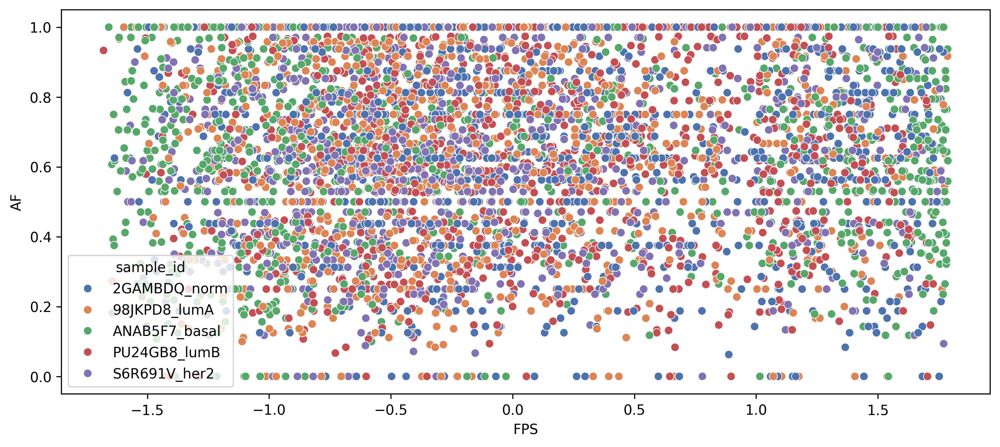

In [100]:
# plot correlation between AF and FPS with sample_id as hue
plt.figure(figsize=(12,5), dpi=300)
sns.scatterplot(data=fps_af_df_pvt, y='AF', x='FPS', hue='sample_id', palette='deep')


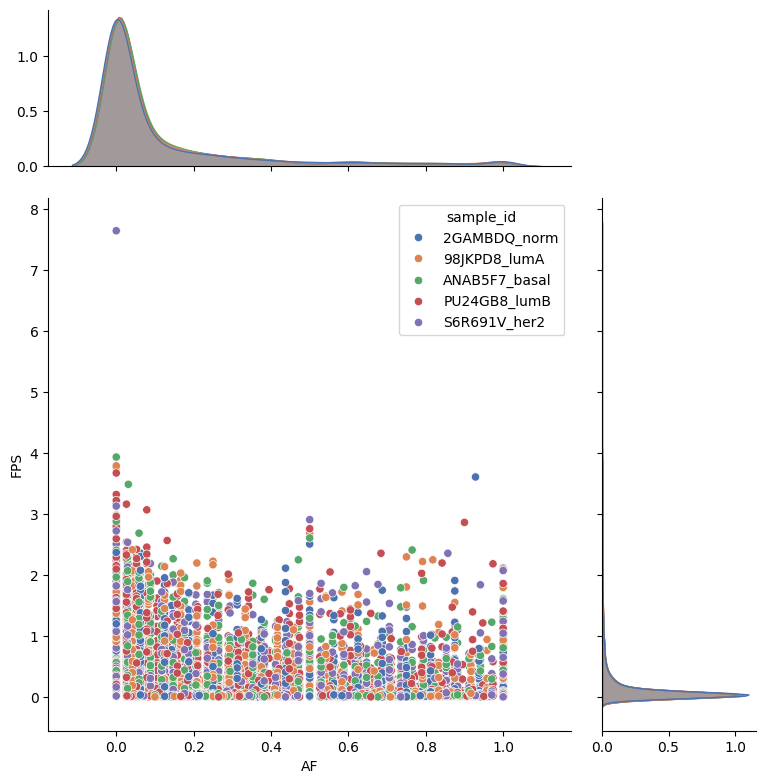

In [41]:
sns.jointplot(data=fps_af_df_merged, x='AF', y='FPS', hue='sample_id', palette='deep', height=8, ratio=3, marginal_ticks=True)